# Import Libraries

In [6]:
install.packages("dplyr")
install.packages("tidyverse")
install.packages("plotrix")
install.packages("caret")
install.packages("rpart")
install.packages("partykit")
install.packages("h2o")
install.packages("cowplot")
install.packages("ggcorrplot")
install.packages("visNetwork")
install.packages("plotrix")
install.packages("RColorBrewer")
install.packages("viridis")

Warning message:
"package 'dplyr' is in use and will not be installed"
Warning message:
"package 'tidyverse' is in use and will not be installed"
Warning message:
"package 'plotrix' is in use and will not be installed"
Warning message:
"package 'caret' is in use and will not be installed"
Warning message:
"package 'rpart' is in use and will not be installed"
Warning message:
"package 'partykit' is in use and will not be installed"
Warning message in download.file(url, destfile, method, mode = "wb", ...):
"downloaded length 0 != reported length 0"
Warning message in download.file(url, destfile, method, mode = "wb", ...):
"URL 'https://cran.r-project.org/bin/windows/contrib/4.3/h2o_3.42.0.2.zip': Timeout of 60 seconds was reached"


Error in download.file(url, destfile, method, mode = "wb", ...) : 
  download from 'https://cran.r-project.org/bin/windows/contrib/4.3/h2o_3.42.0.2.zip' failed


Warning message in download.packages(pkgs, destdir = tmpd, available = available, :
"download of package 'h2o' failed"


package 'cowplot' successfully unpacked and MD5 sums checked

The downloaded binary packages are in
	C:\Users\dvo4383\AppData\Local\Temp\Rtmp4sh13I\downloaded_packages
package 'ggcorrplot' successfully unpacked and MD5 sums checked

The downloaded binary packages are in
	C:\Users\dvo4383\AppData\Local\Temp\Rtmp4sh13I\downloaded_packages
package 'visNetwork' successfully unpacked and MD5 sums checked

The downloaded binary packages are in
	C:\Users\dvo4383\AppData\Local\Temp\Rtmp4sh13I\downloaded_packages


Warning message:
"package 'plotrix' is in use and will not be installed"


package 'RColorBrewer' successfully unpacked and MD5 sums checked

The downloaded binary packages are in
	C:\Users\dvo4383\AppData\Local\Temp\Rtmp4sh13I\downloaded_packages
package 'viridis' successfully unpacked and MD5 sums checked

The downloaded binary packages are in
	C:\Users\dvo4383\AppData\Local\Temp\Rtmp4sh13I\downloaded_packages


In [36]:
install.packages("sparkline")

package 'sparkline' successfully unpacked and MD5 sums checked

The downloaded binary packages are in
	C:\Users\dvo4383\AppData\Local\Temp\Rtmp4sh13I\downloaded_packages


In [2]:
library(dplyr)
library(tidyverse)
library(plotrix)
library(caret)
library(rpart) 
library(partykit)
library(h2o)
library(cowplot)
library(ggcorrplot)
library(visNetwork)
library(plotrix)
library(RColorBrewer)
library(viridis)
library(sparkline)

# Data prepare

## Data import

In [3]:
df <- read.csv("./data/WA_Fn-UseC_-HR-Employee-Attrition.csv")
head(df)

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,⋯,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
,<int>,<chr>,<chr>,<int>,<chr>,<int>,<int>,<chr>,<int>,<int>,⋯,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>
1,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,⋯,1,80,0,8,0,1,6,4,0,5
2,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,⋯,4,80,1,10,3,3,10,7,1,7
3,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,⋯,2,80,0,7,3,3,0,0,0,0
4,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,⋯,3,80,0,8,3,3,8,7,3,0
5,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,⋯,4,80,1,6,3,3,2,2,2,2
6,32,No,Travel_Frequently,1005,Research & Development,2,2,Life Sciences,1,8,⋯,3,80,0,8,2,2,7,7,3,6


In [4]:
# 创建副本
original_df <- df

# Using an insightful summary with skim and kable
df %>% glimpse()

Rows: 1,470
Columns: 35
$ Age                      <int> 41, 49, 37, 33, 27, 32, 59, 30, 38, 36, 35, 2…
$ Attrition                <chr> "Yes", "No", "Yes", "No", "No", "No", "No", "…
$ BusinessTravel           <chr> "Travel_Rarely", "Travel_Frequently", "Travel…
$ DailyRate                <int> 1102, 279, 1373, 1392, 591, 1005, 1324, 1358,…
$ Department               <chr> "Sales", "Research & Development", "Research …
$ DistanceFromHome         <int> 1, 8, 2, 3, 2, 2, 3, 24, 23, 27, 16, 15, 26, …
$ Education                <int> 2, 1, 2, 4, 1, 2, 3, 1, 3, 3, 3, 2, 1, 2, 3, …
$ EducationField           <chr> "Life Sciences", "Life Sciences", "Other", "L…
$ EmployeeCount            <int> 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, …
$ EmployeeNumber           <int> 1, 2, 4, 5, 7, 8, 10, 11, 12, 13, 14, 15, 16,…
$ EnvironmentSatisfaction  <int> 2, 3, 4, 4, 1, 4, 3, 4, 4, 3, 1, 4, 1, 2, 3, …
$ Gender                   <chr> "Female", "Male", "Male", "Female", "Male", "…
$ HourlyRate    

In [5]:
# Look up for missing values
any(is.na(df))

[1] FALSE

## Prepare data for visualization

In [6]:
# Translate into Chinese

df_zh <- df %>%
  mutate(Gender = case_when(
    Gender == "Male" ~ "男",
    Gender == "Female" ~ "女",
    TRUE ~ Gender
  )) %>%
  mutate(Attrition = case_when(
    Attrition == "Yes" ~ "已流失",
    Attrition == "No" ~ "未流失",
    TRUE ~ Attrition
  )) %>%
  mutate(Over18 = case_when(
    Over18 == "Y" ~ "已成年",
    TRUE ~ Over18
  )) %>%
  mutate(OverTime = case_when(
    OverTime == "Yes" ~ "有加班",
    OverTime == "No" ~ "无加班",
    TRUE ~ OverTime
  )) %>%
  mutate(Department = case_when(
    Department == "Research & Development" ~ "研发部门",
    Department == "Sales" ~ "销售部门",
    Department == "Human Resources" ~ "人力部门",
    TRUE ~ Department
  )) %>%
  mutate(JobRole = case_when(
    JobRole == "Sales Executive" ~ "销售主管",
    JobRole == "Research Scientist" ~ "研究科学家",
    JobRole == "Laboratory Technician" ~ "实验室技术员",
    JobRole == "Manufacturing Director" ~ "制造总监",
    JobRole == "Healthcare Representative" ~ "医疗代表",
    JobRole == "Manager" ~ "经理",
    JobRole == "Sales Representative" ~ "销售代表",
    JobRole == "Research Director" ~ "研究总监",
    JobRole == "Human Resources" ~ "人力资源",
    TRUE ~ JobRole
  )) %>%
  mutate(BusinessTravel = case_when(
    BusinessTravel == "Travel_Rarely" ~ "很少出差",
    BusinessTravel == "Travel_Frequently" ~ "频繁出差",
    BusinessTravel == "Non-Travel" ~ "从不出差",
    TRUE ~ BusinessTravel
  )) %>%
  mutate(EducationField = case_when(
    EducationField == "Life Sciences" ~ "生命科学",
    EducationField == "Human Resources" ~ "人力资源",
    EducationField == "Technical Degree" ~ "技术学位",
    EducationField == "Marketing" ~ "市场营销",
    EducationField == "Medical" ~ "医疗",
    EducationField == "Other" ~ "其他",
    TRUE ~ EducationField
  )) %>%
  mutate(MaritalStatus = case_when(
    MaritalStatus == "Single" ~ "单身",
    MaritalStatus == "Married" ~ "已婚",
    MaritalStatus == "Divorced" ~ "离异",
    TRUE ~ MaritalStatus
  ))
df_zh %>% glimpse()

# 重命名列名
col_names <- c('年龄', '流失情况', '出差情况', '日薪', '所属部门', '公里离家距离', '教育水平', '教育领域', '员工数量（恒1）', '员工数量', '环境满意度', '性别', '小时薪', '工作投入度', '岗位级别', '岗位名称', '工作满意度', '婚姻状态', '月收入', '月费率', '在多少家公司工作过', '是否成年', '是否加班', '薪资增长百分比', '绩效评级', '人际关系满意度', '标准工作小时数', '股票期权级别', '总工作年数', '去年接受培训的次数', '工作与生活的平衡情况', '在当前公司的工作年数', '在当前职位的工作年数', '自上次升职以来的年数', '与当前经理合作的年数')
df_zh <- rename(df_zh, !!!setNames(names(df_zh), col_names))
df_zh %>% glimpse()

Rows: 1,470
Columns: 35
$ Age                      <int> 41, 49, 37, 33, 27, 32, 59, 30, 38, 36, 35, 2…
$ Attrition                <chr> "已流失", "未流失", "已流失", "未流失", "未流…
$ BusinessTravel           <chr> "很少出差", "频繁出差", "很少出差", "频繁出差…
$ DailyRate                <int> 1102, 279, 1373, 1392, 591, 1005, 1324, 1358,…
$ Department               <chr> "销售部门", "研发部门", "研发部门", "研发部门…
$ DistanceFromHome         <int> 1, 8, 2, 3, 2, 2, 3, 24, 23, 27, 16, 15, 26, …
$ Education                <int> 2, 1, 2, 4, 1, 2, 3, 1, 3, 3, 3, 2, 1, 2, 3, …
$ EducationField           <chr> "生命科学", "生命科学", "其他", "生命科学", "…
$ EmployeeCount            <int> 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, …
$ EmployeeNumber           <int> 1, 2, 4, 5, 7, 8, 10, 11, 12, 13, 14, 15, 16,…
$ EnvironmentSatisfaction  <int> 2, 3, 4, 4, 1, 4, 3, 4, 4, 3, 1, 4, 1, 2, 3, …
$ Gender                   <chr> "女", "男", "男", "女", "男", "男", "女", "男…
$ HourlyRate               <int> 94, 61, 92, 56, 40, 79, 81, 67, 44, 94, 84, 4…
$ Jo

In [7]:
# 创建副本
original_df_zh <- df_zh

## Prepare data for machine learning

### Convert categorical type data to integer encoding

In [8]:
df_train <- df %>%
  mutate(Gender = ifelse(Gender == "Male", 1, ifelse(Gender == "Female", 0, Gender))) %>%
  mutate(Attrition = ifelse(Attrition == "Yes", 0, ifelse(Attrition == "No", 1, Attrition))) %>%
  mutate(Over18 = ifelse(Over18 == "Y", 1, Over18)) %>%
  mutate(OverTime = ifelse(OverTime == "Yes", 1, ifelse(OverTime == "No", 0, OverTime))) %>%
  mutate(Department = ifelse(Department == "Research & Development", 0,
                             ifelse(Department == "Sales", 1,
                                    ifelse(Department == "Human Resources", 2, Department)))) %>%
  mutate(JobRole = ifelse(JobRole == "Sales Executive", 0,
                          ifelse(JobRole == "Research Scientist", 1,
                                 ifelse(JobRole == "Laboratory Technician", 2,
                                        ifelse(JobRole == "Manufacturing Director", 3,
                                               ifelse(JobRole == "Healthcare Representative", 4,
                                                      ifelse(JobRole == "Manager", 5,
                                                             ifelse(JobRole == "Sales Representative", 6,
                                                                    ifelse(JobRole == "Research Director", 7,
                                                                           ifelse(JobRole == "Human Resources", 8, JobRole)))))))))) %>%
  mutate(BusinessTravel = ifelse(BusinessTravel == "Travel_Rarely", 1,
                                 ifelse(BusinessTravel == "Travel_Frequently", 2,
                                        ifelse(BusinessTravel == "Non-Travel", 0, BusinessTravel)))) %>%
  mutate(EducationField = ifelse(EducationField == "Life Sciences", 0,
                                 ifelse(EducationField == "Human Resources", 1,
                                        ifelse(EducationField == "Technical Degree", 2,
                                               ifelse(EducationField == "Marketing", 3,
                                                      ifelse(EducationField == "Medical", 4,
                                                             ifelse(EducationField == "Other", 5, EducationField))))))) %>%
  mutate(MaritalStatus = ifelse(MaritalStatus == "Single", 0,
                                ifelse(MaritalStatus == "Married", 1,
                                       ifelse(MaritalStatus == "Divorced", 2, MaritalStatus))))

df_train$Gender <- as.integer(df_train$Gender)
df_train$Attrition <- as.integer(df_train$Attrition)
df_train$Over18 <- as.integer(df_train$Over18)
df_train$OverTime <- as.integer(df_train$OverTime)
df_train$Department <- as.integer(df_train$Department)
df_train$JobRole <- as.integer(df_train$JobRole)
df_train$BusinessTravel <- as.integer(df_train$BusinessTravel)
df_train$EducationField <- as.integer(df_train$EducationField)
df_train$MaritalStatus <- as.integer(df_train$MaritalStatus)


df_train %>% glimpse()

Rows: 1,470
Columns: 35
$ Age                      <int> 41, 49, 37, 33, 27, 32, 59, 30, 38, 36, 35, 2…
$ Attrition                <int> 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, …
$ BusinessTravel           <int> 1, 2, 1, 2, 1, 2, 1, 1, 2, 1, 1, 1, 1, 1, 1, …
$ DailyRate                <int> 1102, 279, 1373, 1392, 591, 1005, 1324, 1358,…
$ Department               <int> 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, …
$ DistanceFromHome         <int> 1, 8, 2, 3, 2, 2, 3, 24, 23, 27, 16, 15, 26, …
$ Education                <int> 2, 1, 2, 4, 1, 2, 3, 1, 3, 3, 3, 2, 1, 2, 3, …
$ EducationField           <int> 0, 0, 5, 0, 4, 0, 4, 0, 0, 4, 4, 0, 0, 4, 0, …
$ EmployeeCount            <int> 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, …
$ EmployeeNumber           <int> 1, 2, 4, 5, 7, 8, 10, 11, 12, 13, 14, 15, 16,…
$ EnvironmentSatisfaction  <int> 2, 3, 4, 4, 1, 4, 3, 4, 4, 3, 1, 4, 1, 2, 3, …
$ Gender                   <int> 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, …
$ HourlyRate    

### Delete constant columns

In [9]:
df_train <- select(df_train, -'Over18')
df_train <- select(df_train, -'StandardHours')
df_train <- select(df_train, -'EmployeeCount')

# Static

In [10]:
red <- "#a6dcc3"
darkred <- "#df0017"
green <- "#ffdac2"
yellow <- "#fcffc0"
brown <- "#fed097"
st_y <- "员工数量"
st_y_per <- "员工数量占比"
font <- "serif"

# Analyze basic factors
1. Demographic characteristics(sex, age, marital status, educational level)
2. Department and job role

## Demographic characteristics
Stacked Bar Charts and Percent Stacked Bar Charts

### Sex -> Attrition

`summarise()` has grouped output by '性别'. You can override using the
`.groups` argument.


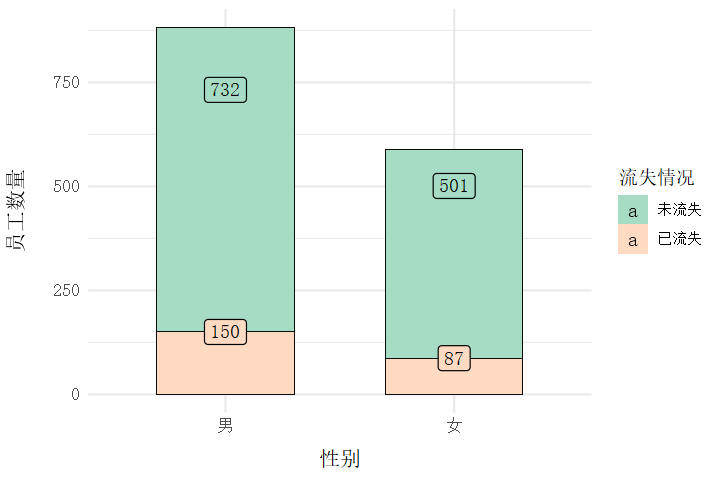

In [13]:
options(repr.plot.width=6, repr.plot.height=4) 

p1_1 <- 
  df_zh %>%
  select(性别, 流失情况) %>% 
  group_by(性别, 流失情况) %>% 
  summarize(n=n()) %>% 
    ggplot(aes(x=性别, y=n, fill = 流失情况)) +
    geom_bar(stat="identity", color="black", size=.2, width=.6, position="stack") +
    geom_label(aes(label=n, y=n), 
               color = "black", family = font) +
    theme_minimal() +
    # 坐标轴标题
    labs(y=st_y) +
    # 填充颜色
    scale_fill_manual(values=c(red, green))+
    # 全图字体&字号
    theme(text = element_text(family = font, size=11)) +
    # 坐标轴外观
    theme(
      # 坐标轴标题距离其他元素间距&字号
      axis.title.x = element_text(margin = margin(t = 10, r = 0, b = 0, l = 0), size=12), 
      axis.title.y = element_text(margin = margin(t = 0, r = 15, b = 0, l = 0), size=12),
      # 坐标轴刻度字号
      axis.text = element_text(size = 10)) 
p1_1

`summarise()` has grouped output by '性别'. You can override using the
`.groups` argument.


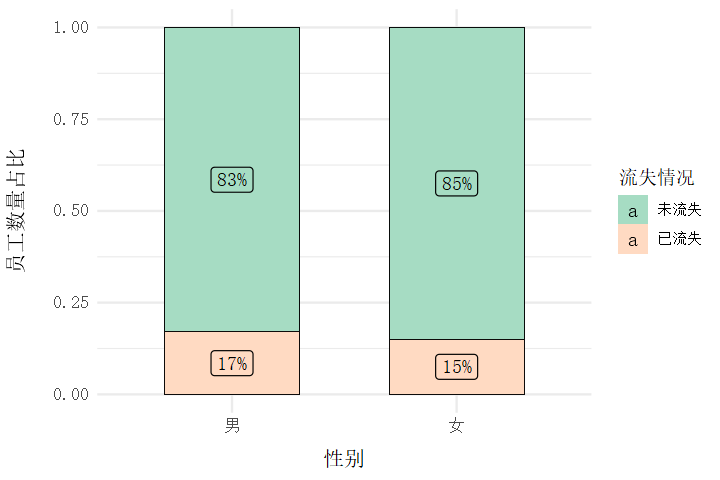

In [14]:
options(repr.plot.width=6, repr.plot.height=4) 

p1_2 <- 
  df_zh %>%
  select(性别, 流失情况) %>% 
  group_by(性别, 流失情况) %>% 
  summarize(n=n()) %>% 
  mutate(pct=round(prop.table(n),2) * 100) %>% arrange(desc(pct)) %>%
    ggplot(aes(x=fct_reorder(性别,pct), y=pct, fill=流失情况, color=流失情况)) + 
    geom_bar(stat="identity", color="black", size=.2, width=.6, position="fill") +
    geom_label(aes(label=paste0(pct, "%"), fill = 流失情况), 
               color = "black", family = font, 
               position = position_fill(vjust = 0.5)) + 
    theme_minimal() +
    # 坐标轴标题
    labs(y=st_y_per, x="性别") +
    # 填充颜色
    scale_fill_manual(values=c(red, green))+
    # 全图字体&字号
    theme(text = element_text(family = font, size=11)) +
    # 坐标轴外观
    theme(
      # 坐标轴标题距离其他元素间距&字号
      axis.title.x = element_text(margin = margin(t = 10, r = 0, b = 0, l = 0), size=12), 
      axis.title.y = element_text(margin = margin(t = 0, r = 15, b = 0, l = 0), size=12),
      # 坐标轴刻度字号
      axis.text = element_text(size = 10))
p1_2

### Age -> Attrition
Devide age into 4 generations

In [16]:
df_zh$代际 <- ifelse(df_zh$年龄<37,"千禧一代",
ifelse(df_zh$年龄>=38 & df_zh$年龄<54,"X世代",
ifelse(df_zh$年龄>=54 & df_zh$年龄<73,"婴儿潮一代",
       "沉默一代"
)))
unique(df_zh$代际)

[1] "X世代"      "沉默一代"   "千禧一代"   "婴儿潮一代"

`summarise()` has grouped output by '代际'. You can override using the
`.groups` argument.


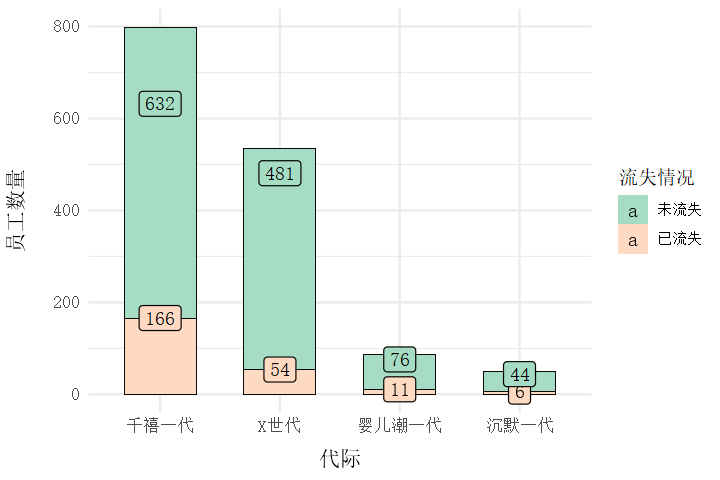

In [17]:
options(repr.plot.width=6, repr.plot.height=4) 

p2_1 <- 
  df_zh %>%
  select(代际, 流失情况) %>% 
  group_by(代际, 流失情况) %>% 
  summarize(n=n()) %>% 
  mutate(代际 = factor(代际, levels=c("千禧一代", "X世代", "婴儿潮一代", "沉默一代"))) %>%
    ggplot(aes(x=代际, y=n, fill = 流失情况)) +
    geom_bar(stat="identity", color="black", size=.2, width=.6, position="stack") +
    geom_label(aes(label=n, y=n), 
               color = "black", family = font) +
    theme_minimal() +
    # 坐标轴标题
    labs(y=st_y) +
    # 填充颜色
    scale_fill_manual(values=c(red, green))+
    # 全图字体&字号
    theme(text = element_text(family = font, size=11)) +
    # 坐标轴外观
    theme(
      # 坐标轴标题距离其他元素间距&字号
      axis.title.x = element_text(margin = margin(t = 10, r = 0, b = 0, l = 0), size=12), 
      axis.title.y = element_text(margin = margin(t = 0, r = 15, b = 0, l = 0), size=12),
      # 坐标轴刻度字号
      axis.text = element_text(size = 10)) 
p2_1

`summarise()` has grouped output by '代际'. You can override using the
`.groups` argument.


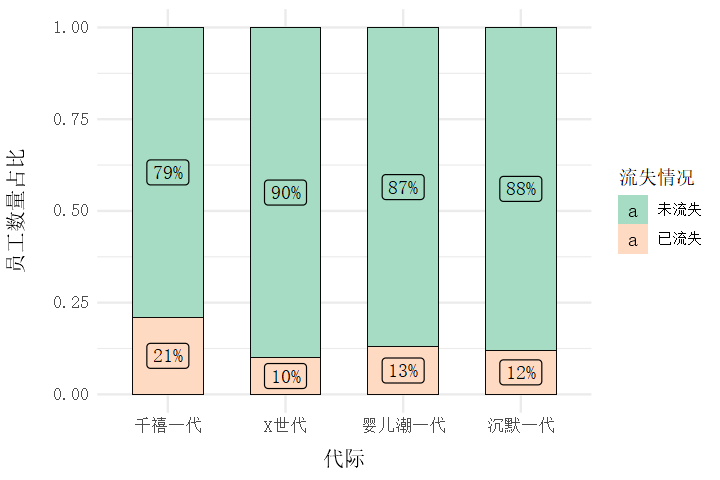

In [18]:
options(repr.plot.width=6, repr.plot.height=4) 

p2_2 <- 
  df_zh %>%
  select(代际, 流失情况) %>% 
  group_by(代际, 流失情况) %>% 
  summarize(n=n()) %>% 
  mutate(pct=round(prop.table(n),2) * 100) %>% arrange(desc(pct)) %>%
  mutate(代际 = factor(代际, levels=c("千禧一代", "X世代", "婴儿潮一代", "沉默一代"))) %>%
    ggplot(aes(x=fct_reorder(代际,pct), y=pct, fill=流失情况, color=流失情况)) + 
    geom_bar(stat="identity", color="black", size=.2, width=0.6, position="fill") +
    geom_label(aes(label=paste0(pct, "%"), fill = 流失情况), 
               color = "black", family = font, 
               position = position_fill(vjust = 0.5)) + 
    theme_minimal() +
    # 坐标轴标题
    labs(y=st_y_per, x="代际") +
    # 填充颜色
    scale_fill_manual(values=c(red, green))+
    # 全图字体&字号
    theme(text = element_text(family = font, size=11)) +
    # 坐标轴外观
    theme(
      # 坐标轴标题距离其他元素间距&字号
      axis.title.x = element_text(margin = margin(t = 10, r = 0, b = 0, l = 0), size=12), 
      axis.title.y = element_text(margin = margin(t = 0, r = 15, b = 0, l = 0), size=12),
      # 坐标轴刻度字号
      axis.text = element_text(size = 10))
p2_2

### Marital status -> Attrition

`summarise()` has grouped output by '婚姻状态'. You can override using the
`.groups` argument.


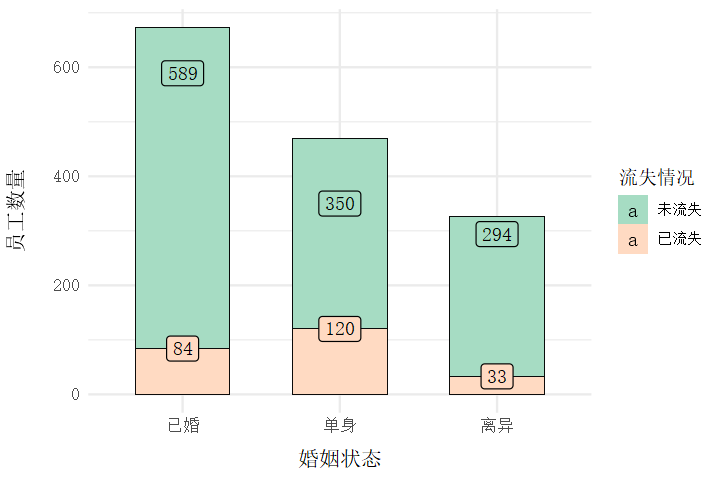

In [19]:
options(repr.plot.width=6, repr.plot.height=4) 

p3_1 <- 
  df_zh %>%
  select(婚姻状态, 流失情况) %>% 
  group_by(婚姻状态, 流失情况) %>% 
  summarize(n=n()) %>% 
  mutate(婚姻状态 = factor(婚姻状态, levels=c("已婚", "单身", "离异"))) %>%
    ggplot(aes(x=婚姻状态, y=n, fill = 流失情况)) +
    geom_bar(stat="identity", color="black", size=.2, width=.6, position="stack") +
    geom_label(aes(label=n, y=n), 
               color = "black", family = font) +
    theme_minimal() +
    # 坐标轴标题
    labs(y=st_y) +
    # 填充颜色
    scale_fill_manual(values=c(red, green))+
    # 全图字体&字号
    theme(text = element_text(family = font, size=11)) +
    # 坐标轴外观
    theme(
      # 坐标轴标题距离其他元素间距&字号
      axis.title.x = element_text(margin = margin(t = 10, r = 0, b = 0, l = 0), size=12), 
      axis.title.y = element_text(margin = margin(t = 0, r = 15, b = 0, l = 0), size=12),
      # 坐标轴刻度字号
      axis.text = element_text(size = 10)) 
p3_1

`summarise()` has grouped output by '婚姻状态'. You can override using the
`.groups` argument.


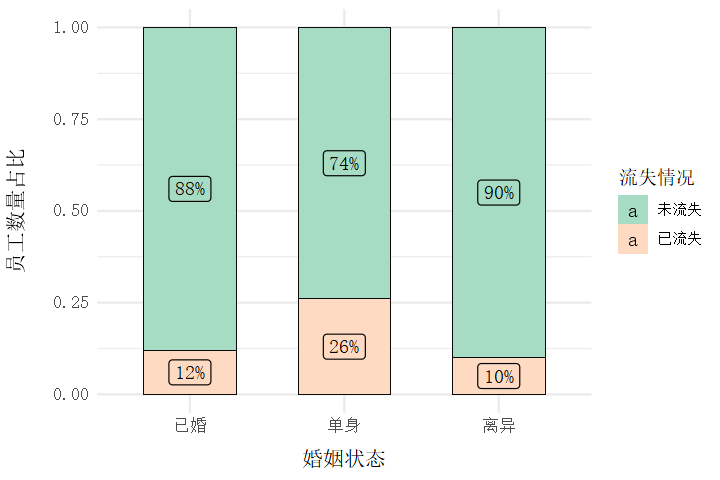

In [20]:
options(repr.plot.width=6, repr.plot.height=4) 

p3_2 <- 
  df_zh %>%
  select(婚姻状态, 流失情况) %>% 
  group_by(婚姻状态, 流失情况) %>% 
  summarize(n=n()) %>% 
  mutate(pct=round(prop.table(n),2) * 100) %>% arrange(desc(pct)) %>%
  mutate(婚姻状态 = factor(婚姻状态, levels=c("已婚", "单身", "离异"))) %>%
    ggplot(aes(x=fct_reorder(婚姻状态,pct), y=pct, fill=流失情况, color=流失情况)) + 
    geom_bar(stat="identity", color="black", size=.2, width=0.6, position="fill") +
    geom_label(aes(label=paste0(pct, "%"), fill = 流失情况), 
               color = "black", family = font, 
               position = position_fill(vjust = 0.5)) + 
    theme_minimal() +
    # 坐标轴标题
    labs(y=st_y_per, x="婚姻状态") +
    # 填充颜色
    scale_fill_manual(values=c(red, green))+
    # 全图字体&字号
    theme(text = element_text(family = font, size=11)) +
    # 坐标轴外观
    theme(
      # 坐标轴标题距离其他元素间距&字号
      axis.title.x = element_text(margin = margin(t = 10, r = 0, b = 0, l = 0), size=12), 
      axis.title.y = element_text(margin = margin(t = 0, r = 15, b = 0, l = 0), size=12),
      # 坐标轴刻度字号
      axis.text = element_text(size = 10))
p3_2

### Educational level -> Attrition

In [23]:
df_zh$教育水平_文字 <- 
ifelse(df_zh$教育水平 == 1, "本科以下学历",
ifelse(df_zh$教育水平 == 2, "本科学历",
ifelse(df_zh$教育水平 == 3, "学士学位",
ifelse(df_zh$教育水平 == 4, "硕士学位", 
       "博士学位"))))
unique(df_zh$教育水平_文字)


[1] "本科学历"     "本科以下学历" "硕士学位"     "学士学位"     "博士学位"

`summarise()` has grouped output by '教育水平_文字'. You can override using the
`.groups` argument.


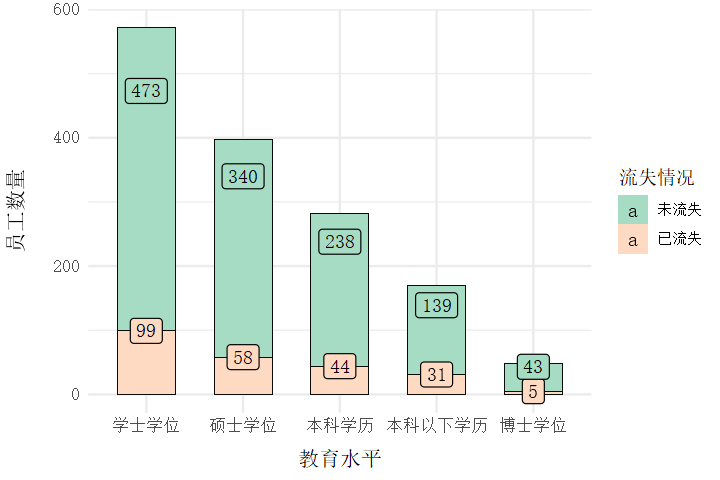

In [24]:
options(repr.plot.width=6, repr.plot.height=4) 

p4_1 <- 
  df_zh %>%
  select(教育水平_文字, 流失情况) %>% 
  group_by(教育水平_文字, 流失情况) %>% 
  summarize(n=n()) %>% 
  mutate(教育水平_文字 = factor(教育水平_文字, levels=c("学士学位", "硕士学位", "本科学历", "本科以下学历", "博士学位"))) %>%
    ggplot(aes(x=教育水平_文字, y=n, fill = 流失情况)) +
    geom_bar(stat="identity", color="black", size=.2, width=.6, position="stack") +
    geom_label(aes(label=n, y=n), 
               color = "black", family = font) +
    theme_minimal() +
    # 坐标轴标题
    labs(y=st_y, x="教育水平") +
    # 填充颜色
    scale_fill_manual(values=c(red, green))+
    # 全图字体&字号
    theme(text = element_text(family = font, size=11)) +
    # 坐标轴外观
    theme(
      # 坐标轴标题距离其他元素间距&字号
      axis.title.x = element_text(margin = margin(t = 10, r = 0, b = 0, l = 0), size=12), 
      axis.title.y = element_text(margin = margin(t = 0, r = 15, b = 0, l = 0), size=12),
      # 坐标轴刻度字号
      axis.text = element_text(size = 10)) 
p4_1

`summarise()` has grouped output by '教育水平_文字'. You can override using the
`.groups` argument.


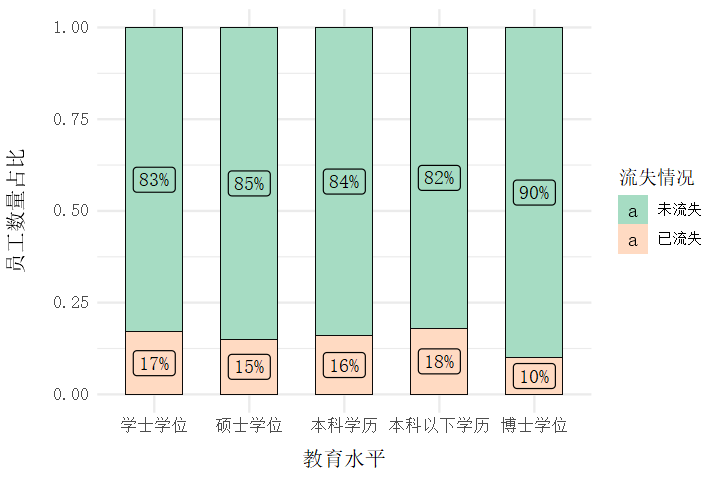

In [25]:
options(repr.plot.width=6, repr.plot.height=4) 

p4_2 <- 
  df_zh %>%
  select(教育水平_文字, 流失情况) %>% 
  group_by(教育水平_文字, 流失情况) %>% 
  summarize(n=n()) %>% 
  mutate(pct=round(prop.table(n),2) * 100) %>% arrange(desc(pct)) %>%
  mutate(教育水平_文字 = factor(教育水平_文字, levels=c("学士学位", "硕士学位", "本科学历", "本科以下学历", "博士学位"))) %>%
    ggplot(aes(x=fct_reorder(教育水平_文字,pct), y=pct, fill=流失情况, color=流失情况)) + 
    geom_bar(stat="identity", color="black", size=.2, width=0.6, position="fill") +
    geom_label(aes(label=paste0(pct, "%"), fill = 流失情况), 
               color = "black", family = font, 
               position = position_fill(vjust = 0.5)) + 
    theme_minimal() +
    # 坐标轴标题
    labs(y=st_y_per, x="教育水平") +
    # 填充颜色
    scale_fill_manual(values=c(red, green))+
    # 全图字体&字号
    theme(text = element_text(family = font, size=11)) +
    # 坐标轴外观
    theme(
      # 坐标轴标题距离其他元素间距&字号
      axis.title.x = element_text(margin = margin(t = 10, r = 0, b = 0, l = 0), size=12), 
      axis.title.y = element_text(margin = margin(t = 0, r = 15, b = 0, l = 0), size=12),
      # 坐标轴刻度字号
      axis.text = element_text(size = 10))
p4_2

Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
"conversion failure on '流失情况' in 'mbcsToSbcs': dot substituted for <e6>"
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
"conversion failure on '流失情况' in 'mbcsToSbcs': dot substituted for <b5>"
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
"conversion failure on '流失情况' in 'mbcsToSbcs': dot substituted for <81>"
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
"conversion failure on '流失情况' in 'mbcsToSbcs': dot substituted for <e5>"
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
"conversion failure on '流失情况' in 'mbcsToSbcs': dot substituted for <a4>"
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
"conversion failure on '流失情况' in 'mbcsToSbcs': dot substituted for <b1>"
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), 

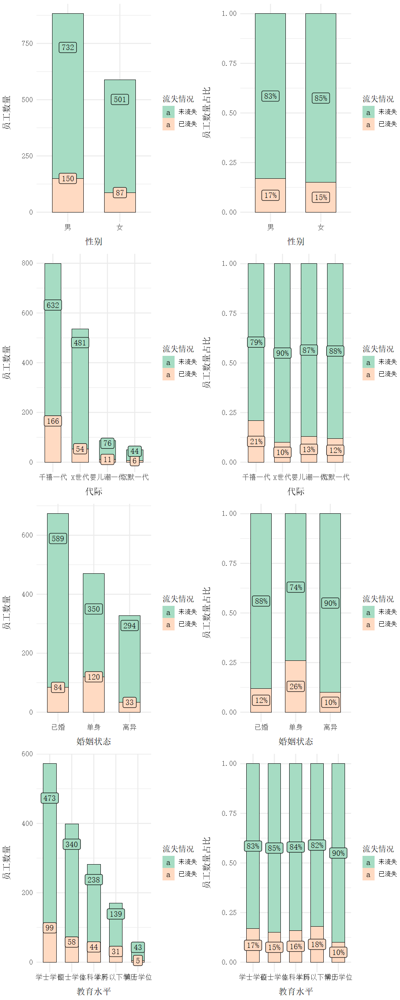

In [26]:
options(repr.plot.width=8, repr.plot.height=20) 

plot_grid(p1_1, p1_2, p2_1, p2_2, p3_1, p3_2, p4_1, p4_2, ncol=2, nrow=4)

## Department and job role
Pyramid scheme

### Department -> Attrition

`summarise()` has grouped output by '所属部门'. You can override using the
`.groups` argument.


86 86 


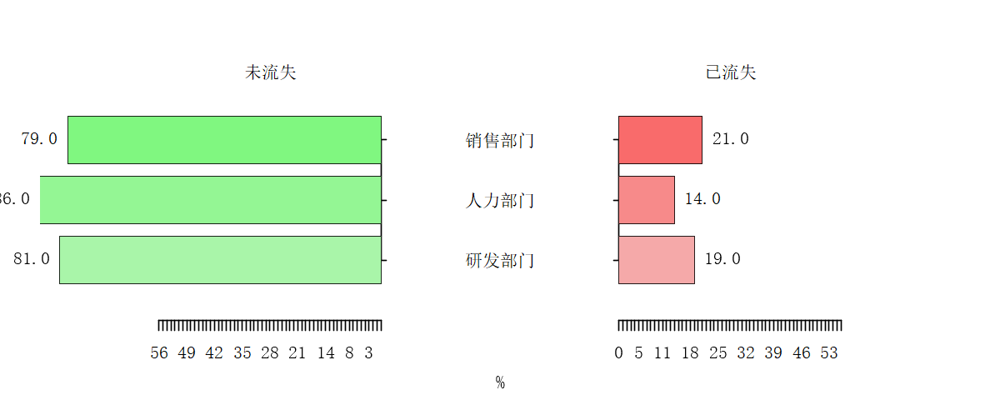

In [27]:
options(repr.plot.width=10, repr.plot.height=4) 

attr.dep <- df_zh %>% 
select(所属部门, 流失情况) %>% 
group_by(所属部门, 流失情况) %>% 
summarize(amount=n()) %>%
mutate(pct=round(prop.table(amount),2) * 100) %>% 
arrange(pct)

nofunc <- colorRampPalette(c("#A9F5A9", "#58FA58", "#01DF01"))
yesfunc <- colorRampPalette(c("#F5A9A9", "#FE2E2E", "#B40404"))

yes.attr <- attr.dep %>% 
filter(流失情况 == "已流失") %>% 
arrange(所属部门) 

no.attr <- attr.dep %>% 
filter(流失情况 == "未流失") %>% 
arrange(所属部门)

# 使用par指定字体、线粗等
par(family = font, lwd=0.5)
par(mar = pyramid.plot(no.attr$pct, yes.attr$pct, 
                       labels = unique(attr.dep$所属部门),
                       top.labels=c("未流失","","已流失"),
                       gap=30, show.values = T, 
                       rxcol = yesfunc(9), lxcol = nofunc(9)))

### Job role -> Attrition

`summarise()` has grouped output by '岗位名称'. You can override using the
`.groups` argument.


98 98 


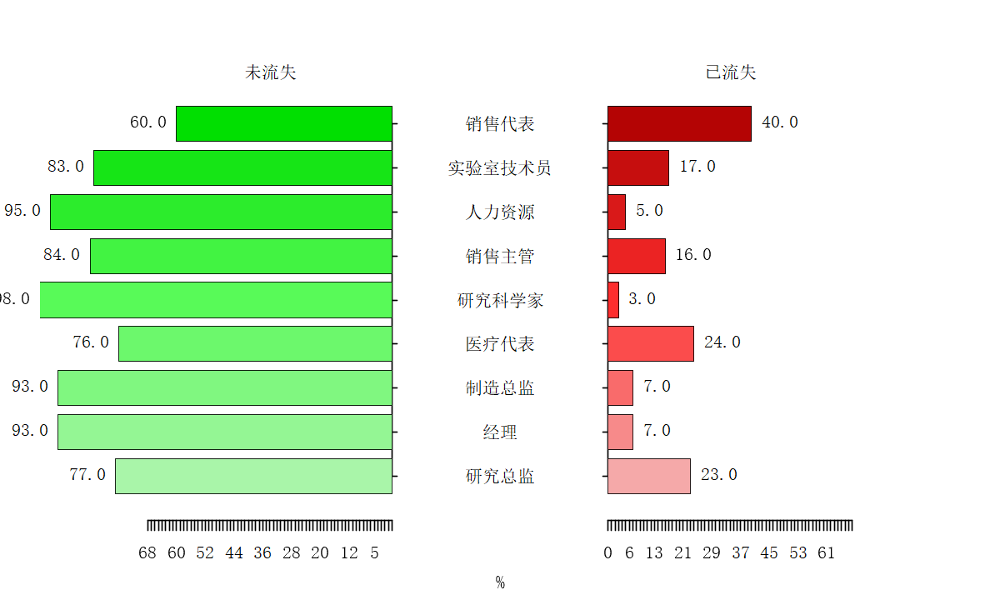

In [28]:
options(repr.plot.width=10, repr.plot.height=6) 

attr.job <- df_zh %>% 
select(岗位名称, 流失情况) %>% 
group_by(岗位名称, 流失情况) %>% 
summarize(amount=n()) %>%
mutate(pct=round(prop.table(amount),2) * 100) %>% 
arrange(pct)

nofunc <- colorRampPalette(c("#A9F5A9", "#58FA58", "#01DF01"))
yesfunc <- colorRampPalette(c("#F5A9A9", "#FE2E2E", "#B40404"))

yes.attr <- attr.job %>% 
filter(流失情况 == "已流失") %>% 
arrange(岗位名称) 

no.attr <- attr.job %>% 
filter(流失情况 == "未流失") %>% 
arrange(岗位名称)

# 使用par指定字体、线粗等
par(family = font, lwd=0.5)
par(mar = pyramid.plot(no.attr$pct, yes.attr$pct, 
                       labels = unique(attr.job$岗位名称),
                       top.labels=c("未流失","","已流失"),
                       gap=30, show.values = T, 
                       rxcol = yesfunc(9), lxcol = nofunc(9)))

#  Ranking of feature importance
1. Decision Tree
2. H2O AutoML

## Decision Tree

A decision tree is a machine learning algorithm for building predictive models and performing classification or regression analysis. It creates a tree-like structure by selecting the best features from a dataset, where each internal node represents a feature and each leaf node represents a category or a prediction.

In [29]:
set.seed(142)
# I personally prefer to shuffle my data before splitting.
df_zh <- df_zh[sample(nrow(df_zh)),]

# Let's encode the ordinal variables
df_zh$出差情况 = factor(df_zh$出差情况,
                         levels = c('频繁出差', '很少出差', '从不出差'),
                         labels = c(1, 2, 3))

# Changing the datatype from integer to factors from the ordinal variables.
cols <- c("教育水平", "环境满意度", "工作投入度", "岗位级别",
         "工作满意度", "绩效评级", "人际关系满意度", 
         "股票期权级别", "去年接受培训的次数", "工作与生活的平衡情况")

df_zh[cols] <- lapply(df_zh[cols], factor)

# Splitting our data
trainIndex <- createDataPartition(df_zh$流失情况, p=0.8, list=FALSE, times=1)

train <- df_zh[trainIndex,]
test <- df_zh[-trainIndex,]

In [33]:
# Checking that both the training and testing sets have the same label proportions.
prop_train <- train %>% select(流失情况) %>% group_by(流失情况) %>% summarize(n=n()) %>%
mutate(pct=round(prop.table(n), 2))

prop_test <- test %>% select(流失情况) %>% group_by(流失情况) %>% summarize(n=n()) %>%
mutate(pct=round(prop.table(n), 2))

prop_train
prop_test

流失情况,n,pct
<chr>,<int>,<dbl>
已流失,190,0.16
未流失,987,0.84


流失情况,n,pct
<chr>,<int>,<dbl>
已流失,47,0.16
未流失,246,0.84


In [33]:
options(repr.plot.width=15, repr.plot.height=10) 

# 构建了一个决策树模型
tree <- rpart(流失情况 ~ ., data=train)

visTree(tree,height = "800px",
        colorY = c("green","red","blue"))

HTML widgets cannot be represented in plain text (need html)

In [32]:
prune.tree <- prune(tree, cp=0.02) # pruning the tree

visTree(prune.tree,height = "600px",
        colorY = c("green","red","blue"))

rparty.tree <- as.party(tree)
rparty.tree

HTML widgets cannot be represented in plain text (need html)


Model formula:
流失情况 ~ 年龄 + 出差情况 + 日薪 + 所属部门 + 
    公里离家距离 + 教育水平 + 教育领域 + `员工数量（恒1）` + 
    员工数量 + 环境满意度 + 性别 + 小时薪 + 工作投入度 + 
    岗位级别 + 岗位名称 + 工作满意度 + 婚姻状态 + 
    月收入 + 月费率 + 在多少家公司工作过 + 是否成年 + 
    是否加班 + 薪资增长百分比 + 绩效评级 + 人际关系满意度 + 
    标准工作小时数 + 股票期权级别 + 总工作年数 + 
    去年接受培训的次数 + 工作与生活的平衡情况 + 
    在当前公司的工作年数 + 在当前职位的工作年数 + 
    自上次升职以来的年数 + 与当前经理合作的年数 + 
    代际 + 教育水平_文字

Fitted party:
[1] root
|   [2] 总工作年数 >= 2.5
|   |   [3] 是否加班 in 无加班
|   |   |   [4] 股票期权级别 in 1, 2, 3: 未流失 (n = 462, err = 5.0%)
|   |   |   [5] 股票期权级别 in 0
|   |   |   |   [6] 工作满意度 in 2, 3, 4: 未流失 (n = 256, err = 9.0%)
|   |   |   |   [7] 工作满意度 in 1
|   |   |   |   |   [8] 人际关系满意度 in 2, 4: 未流失 (n = 34, err = 8.8%)
|   |   |   |   |   [9] 人际关系满意度 in 1, 3
|   |   |   |   |   |   [10] 岗位名称 in 经理, 人力资源, 医疗代表, 制造总监: 未流失 (n = 10, err = 0.0%)
|   |   |   |   |   |   [11] 岗位名称 in 实验室技术员, 销售代表, 销售主管, 研究科学家: 已流失 (n = 19, err = 26.3%)
|   |   [12] 是否加班 in 有加班
|   |   |   [13] 月收入 >= 3751.5
|   |   |   |   [14] 婚姻状态 in 离异, 

Warning message in brewer.pal(24, "Pastel1"):
"n too large, allowed maximum for palette Pastel1 is 9
Returning the palette you asked for with that many colors
"


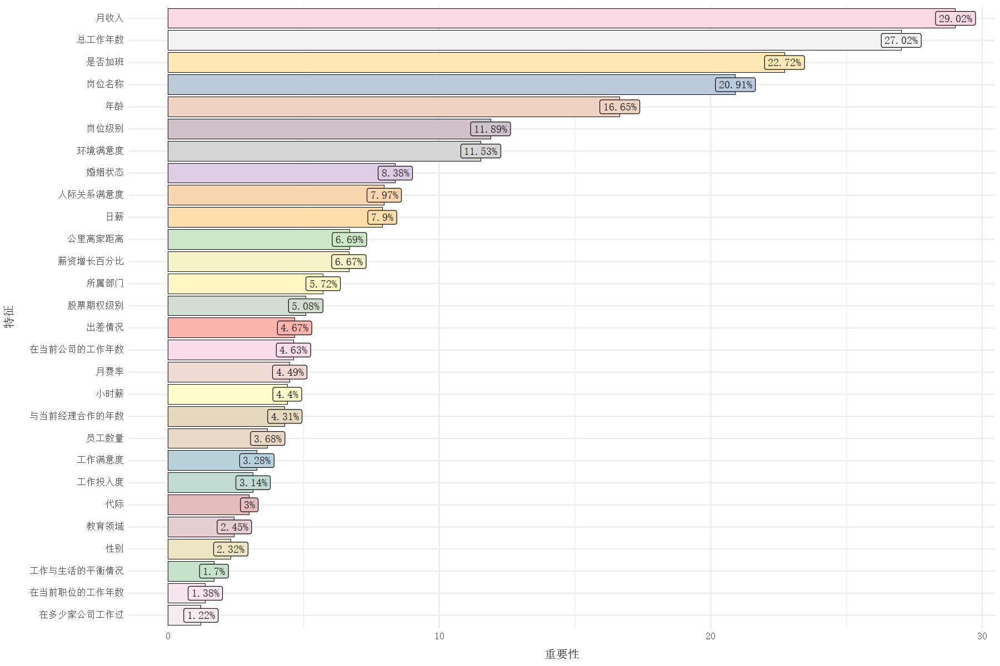

In [34]:
# Complicated DecisionTree, Is there a way to determine variable importance?
var_imp <- data.frame(tree$variable.importance)
var_imp$features <- rownames(var_imp)
var_imp <- var_imp[, c(2, 1)]
var_imp$importance <- round(var_imp$tree.variable.importance, 2)
var_imp$tree.variable.importance <- NULL

colorCount <- length(unique(var_imp$features))
feature_importance <- var_imp %>%
ggplot(aes(x=reorder(features, importance), y=importance, fill=features)) + 
geom_bar(stat='identity', color="black", size=0.2) + 
coord_flip() + 
scale_fill_manual(values = colorRampPalette(brewer.pal(24, "Pastel1"))(colorCount)) + 
theme_minimal() +
theme(# 全图字体&字号
      text = element_text(family = font, size=11),
      # 不显示图例
      legend.position="none", 
      # 坐标轴标题距离其他元素间距&字号
      axis.title.x = element_text(margin = margin(t = 10, r = 0, b = 0, l = 0), size=12), 
      axis.title.y = element_text(margin = margin(t = 0, r = 15, b = 0, l = 0), size=12),
      # 坐标轴刻度字号
      axis.text = element_text(size = 10)) + 
geom_label(aes(label=paste0(importance, "%")), color = "black", family = font) + 
labs(x="特征", y="重要性")

feature_importance

The order of importance of the characteristics is shown. Monthly income has the highest impact of most attrition, followed by total years of work, and in descending order of importance by whether or not overtime is worked, position, and age.

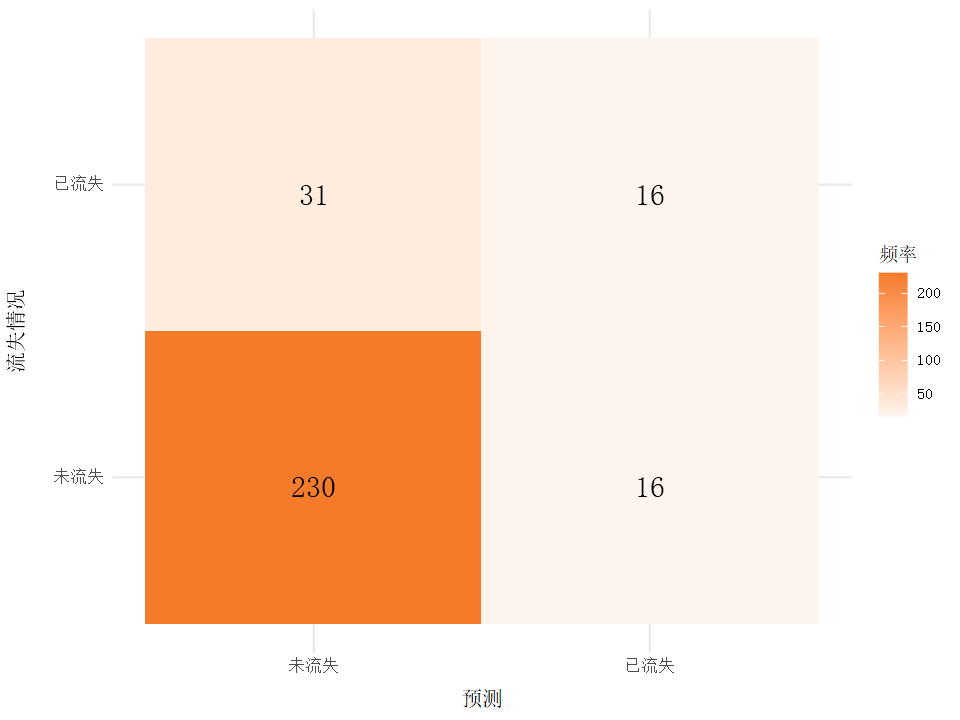

In [35]:
options(repr.plot.width=8, repr.plot.height=6) 

predictions <- predict(tree, test, type="class")
conf_df <- data.frame(table(test$流失情况, predictions))

ggplot(data =  conf_df, mapping = aes(x = predictions, y = Var1)) +
geom_tile(aes(fill = Freq)) +
geom_text(aes(label = sprintf("%1.0f", Freq)), vjust = 1, family = "serif", size=6) +
scale_fill_gradient(low = "#fcf4ed", high = "#f47b2a") +
theme_minimal() +
theme(# 全图字体&字号
      text = element_text(family = "serif", size=11),
      # 坐标轴标题距离其他元素间距&字号
      axis.title.x = element_text(margin = margin(t = 10, r = 0, b = 0, l = 0), size=12), 
      axis.title.y = element_text(margin = margin(t = 0, r = 15, b = 0, l = 0), size=12),
      # 坐标轴刻度字号
      axis.text = element_text(size = 10)) + 
labs(y="流失情况", x="预测", fill="频率")

The model performs poorly in terms of accuracy, precision and specificity, while performing better in terms of recall. This could mean that the model has some ability to recognize positive categories but is less capable of distinguishing negative categories.

## H2O AutoML

H2O is an open source distributed machine learning platform that provides a rich set of machine learning algorithms and tools that make building and deploying machine learning models more efficient and convenient.

H2O machine learning models have the advantages of high performance, diverse algorithm support, and automated feature engineering, making them a powerful tool for analyzing the factors affecting employee turnover. By leveraging the H2O platform, the causes of employee turnover can be analyzed more quickly and accurately, and corresponding management measures can be taken to improve employee satisfaction and retention, thus enhancing the stability and competitiveness of the organization.

Use H2O AutoML to run an automated machine learning process that automatically builds and evaluates multiple models based on a given training dataset with a target variable of churning and generates a model leaderboard. 

The appearance of a progress bar to 100% is considered a successful build.

In [36]:
# 启动模型
h2o.init()

# 将数据框改成h2o格式
h2o_df <- as.h2o(df_train)

# 拆分训练集、测试集、验证集
split_df <- h2o.splitFrame(h2o_df, c(0.7, 0.15), seed=12)
h2o_train <- h2o.assign(split_df[[1]], "train")
h2o_validation <- h2o.assign(split_df[[2]], "validation")
h2o_test <- h2o.assign(split_df[[2]], "test")

h2o.describe(h2o_train)


H2O is not running yet, starting it now...

Note:  In case of errors look at the following log files:
    C:\Users\XQ\AppData\Local\Temp\RtmpaMIXY6\fileed41b227f97/h2o_XQ_started_from_r.out
    C:\Users\XQ\AppData\Local\Temp\RtmpaMIXY6\fileed475e76f9e/h2o_XQ_started_from_r.err


Starting H2O JVM and connecting: . Connection successful!

R is connected to the H2O cluster: 
    H2O cluster uptime:         4 seconds 823 milliseconds 
    H2O cluster timezone:       Asia/Shanghai 
    H2O data parsing timezone:  UTC 
    H2O cluster version:        3.40.0.4 
    H2O cluster version age:    6 months and 24 days 
    H2O cluster name:           H2O_started_from_R_XQ_mas852 
    H2O cluster total nodes:    1 
    H2O cluster total memory:   3.95 GB 
    H2O cluster total cores:    8 
    H2O cluster allowed cores:  8 
    H2O cluster healthy:        TRUE 
    H2O Connection ip:          localhost 
    H2O Connection port:        54321 
    H2O Connection proxy:       NA 
    H2O Internal Sec

Warning message in h2o.clusterInfo():
"
Your H2O cluster version is (6 months and 24 days) old. There may be a newer version available.
Please download and install the latest version from: https://h2o-release.s3.amazonaws.com/h2o/latest_stable.html"



  |======================================================================| 100%


Label,Type,Missing,Zeros,PosInf,NegInf,Min,Max,Mean,Sigma,Cardinality
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Age,int,0,0,0,0,18,60,3.695873e+01,9.2341317,NA
Attrition,int,0,168,0,0,0,1,8.387716e-01,0.3679181,NA
BusinessTravel,int,0,105,0,0,0,2,1.087332e+00,0.5305760,NA
DailyRate,int,0,0,0,0,102,1499,7.901727e+02,405.2567110,NA
Department,int,0,684,0,0,0,2,3.905950e-01,0.5765409,NA
DistanceFromHome,int,0,0,0,0,1,29,9.029750e+00,8.0638707,NA
Education,int,0,0,0,0,1,5,2.901152e+00,1.0180025,NA
EducationField,int,0,448,0,0,0,5,2.002879e+00,1.8931575,NA
EmployeeNumber,int,0,0,0,0,1,2065,1.031714e+03,608.6139027,NA


A Warning: "AutoML: XGBoost is not available; skipping it."

Because AutoML is unable to build XGBoost models on Windows.

In [38]:
# Establish X and Y (Features and Labels)
y <- "Attrition"
x <- setdiff(names(h2o_train), y)

auto_ml <- h2o.automl(
    # 指定目标变量
    y = y,
    # 指定特征变量
    x = x,
    # 指定用于训练的数据集
    training_frame = h2o_train,
    # 指定用于生成排行榜的数据集
    leaderboard_frame = h2o_validation,
    project_name = "Attribution",
    max_models = 10,
    seed = 12
)

# Check for the top models
top_models <- auto_ml@leaderboard
print(top_models)

  |==                                                                    |   3%
23:37:53.999: AutoML: XGBoost is not available; skipping it.
23:37:54.78: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.
  |====                                                                  |   6%nly 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.
23:37:57.203: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.
  |========                                                              |  12%ly 2 unique values (0/1). If you wish to train a binary model instead of a regression

In [39]:
# Get the best model
# Our aim is to determine the feature importance
model_id <- as.data.frame(top_models$model_id)[,1]
best_family <- h2o.getModel(grep("StackedEnsemble_BestOfFamily", model_id, value=TRUE)[1])
obtain_model <- h2o.getModel(best_family@model$metalearner$name)

In [40]:
# How important is each model to the StackEnsemble
h2o.varimp(obtain_model)

variable,relative_importance,scaled_importance,percentage
<chr>,<dbl>,<dbl>,<dbl>
GBM_4_AutoML_1_20231121_233753,0.055622578,1.0000000,0.27299205
GLM_1_AutoML_1_20231121_233753,0.053264495,0.9576057,0.26141873
DRF_1_AutoML_1_20231121_233753,0.049367692,0.8875477,0.24229347
DeepLearning_1_AutoML_1_20231121_233753,0.035710063,0.6420066,0.17526270
XRT_1_AutoML_1_20231121_233753,0.009786812,0.1759503,0.04803304


The model importance ranking is shown, and the top three ranked models (GLM, GBM, DRF) will be used next for feature importance analysis.

variable,relative_importance,scaled_importance,percentage
<chr>,<dbl>,<dbl>,<dbl>
MonthlyIncome,58.647167,1.00000000,0.099727934
OverTime,44.447372,0.75787757,0.075581564
Age,37.004238,0.63096378,0.062924714
DailyRate,29.859972,0.50914602,0.050776081
MaritalStatus,28.639126,0.48832923,0.048700065
MonthlyRate,25.045486,0.42705364,0.042589178
EnvironmentSatisfaction,24.644251,0.42021213,0.041906887
NumCompaniesWorked,22.847263,0.38957147,0.038851158
JobSatisfaction,22.775900,0.38835465,0.038729807


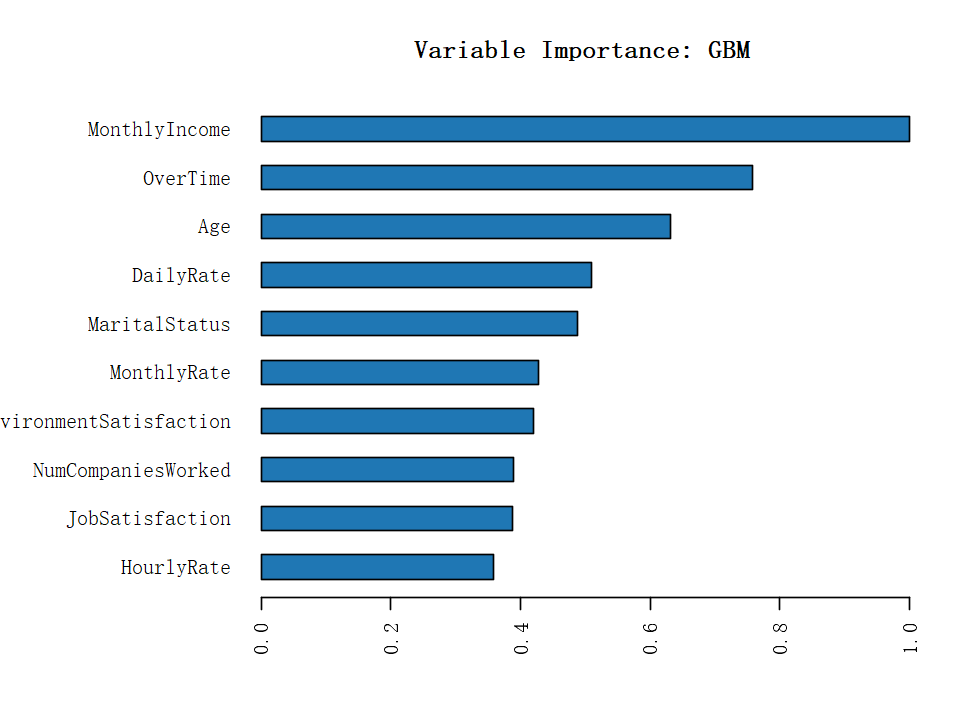

In [41]:
xgb <- h2o.getModel(grep("GBM", model_id, value = TRUE)[1])

# Examine the variable importance of the top XGBoost model
# XGBoost can show the feature importance as oppose to the stack ensemble
h2o.varimp(xgb)

# We can also plot the base learner contributions to the ensemble.
par(family=font)
h2o.varimp_plot(xgb)

variable,relative_importance,scaled_importance,percentage
<chr>,<dbl>,<dbl>,<dbl>
OverTime,249.612961,1.00000000,0.075939889
MonthlyIncome,219.615662,0.87982475,0.066813794
Age,200.710754,0.80408787,0.061062344
DailyRate,167.691483,0.67180599,0.051016872
MonthlyRate,150.094620,0.60130940,0.045663369
YearsAtCompany,141.339081,0.56623294,0.042999667
TotalWorkingYears,135.195480,0.54162043,0.041130596
DistanceFromHome,133.649551,0.53542713,0.040660277
HourlyRate,132.320740,0.53010364,0.040256012


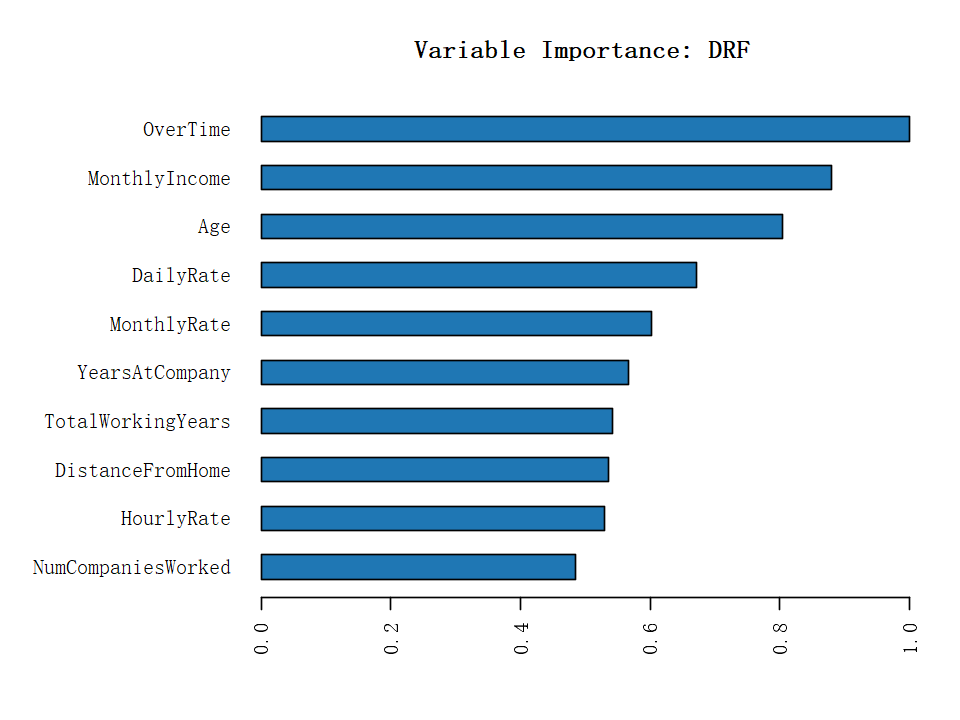

In [42]:
xgb <- h2o.getModel(grep("DRF", model_id, value = TRUE)[1])

# Examine the variable importance of the top XGBoost model
# XGBoost can show the feature importance as oppose to the stack ensemble
h2o.varimp(xgb)

# We can also plot the base learner contributions to the ensemble.
par(family=font)
h2o.varimp_plot(xgb)

variable,relative_importance,scaled_importance,percentage
<chr>,<dbl>,<dbl>,<dbl>
OverTime,8.685281e-02,1.0000000000,0.1312032664
BusinessTravel,4.396939e-02,0.5062517655,0.0664218853
NumCompaniesWorked,4.366436e-02,0.5027397261,0.0659610942
MaritalStatus,4.096025e-02,0.4716053281,0.0618761595
Age,3.883078e-02,0.4470871489,0.0586592943
JobSatisfaction,3.691411e-02,0.4250192178,0.0557639097
Department,3.515900e-02,0.4048112551,0.0531125589
JobInvolvement,3.515749e-02,0.4047939267,0.0531102854
EnvironmentSatisfaction,3.375427e-02,0.3886375847,0.0509905206


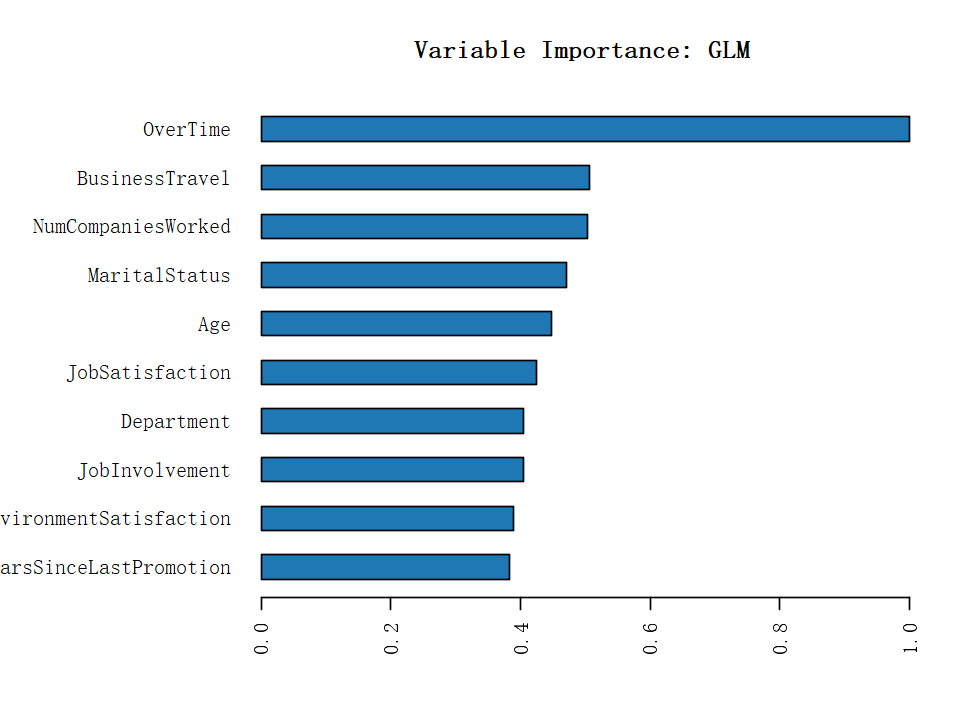

In [43]:
xgb <- h2o.getModel(grep("GLM", model_id, value = TRUE)[1])

# Examine the variable importance of the top XGBoost model
# XGBoost can show the feature importance as oppose to the stack ensemble
h2o.varimp(xgb)

# We can also plot the base learner contributions to the ensemble.
par(family=font)
h2o.varimp_plot(xgb)

Combining the results of the models, the factors that most affect employee turnover are overtime, monthly income, and age.

# Analyze important factors
1. Important factors -> Attrition
2. Basic factors -> Important factors
3. Correlation coefficient analysis

## Important factors -> Attrition
1. Overtime work
2. Monthly income

### Overtime work -> Attrition

`summarise()` has grouped output by '是否加班'. You can override using the
`.groups` argument.


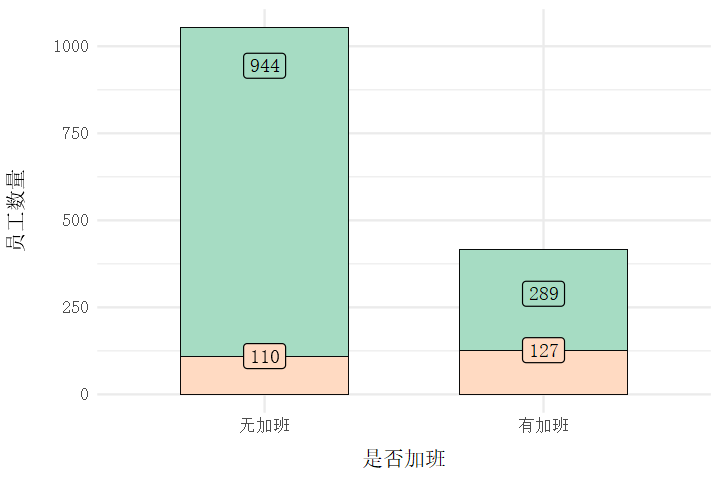

In [44]:
options(repr.plot.width=6, repr.plot.height=4) 

p1_1 <- 
  df_zh %>%
  select(是否加班, 流失情况) %>% 
  group_by(是否加班, 流失情况) %>% 
  summarize(n=n()) %>% 
    ggplot(aes(x=是否加班, y=n, fill = 流失情况)) +
    geom_bar(stat="identity", color="black", size=.2, width=.6, position="stack") +
    geom_label(aes(label=n, y=n), 
               color = "black", family = font) +
    theme_minimal() +
    # 坐标轴标题
    labs(y=st_y) +
    # 填充颜色
    scale_fill_manual(values=c(red, green))+
    # 全图字体&字号
    theme(text = element_text(family = font, size=11)) +
    # 坐标轴外观
    theme(
      # 坐标轴标题距离其他元素间距&字号
      axis.title.x = element_text(margin = margin(t = 10, r = 0, b = 0, l = 0), size=12), 
      axis.title.y = element_text(margin = margin(t = 0, r = 15, b = 0, l = 0), size=12),
      # 坐标轴刻度字号
      axis.text = element_text(size = 10)) +
    # 不显示图例
    theme(legend.position="none")
p1_1

`summarise()` has grouped output by '是否加班'. You can override using the
`.groups` argument.


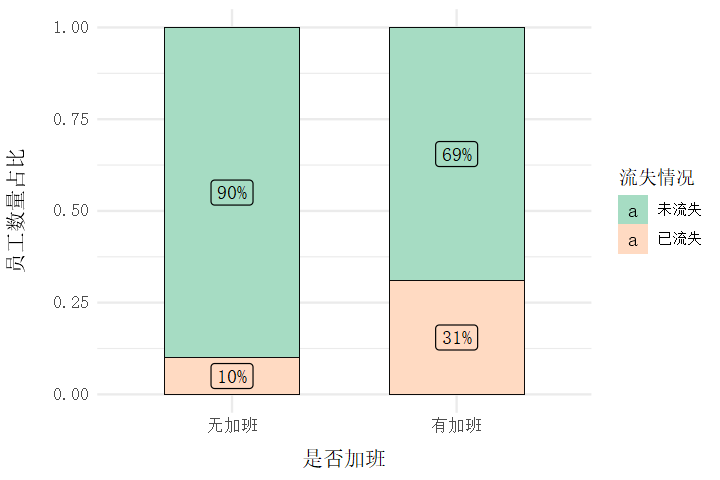

In [45]:
options(repr.plot.width=6, repr.plot.height=4) 

p1_2 <- 
  df_zh %>%
  select(是否加班, 流失情况) %>% 
  group_by(是否加班, 流失情况) %>% 
  summarize(n=n()) %>% 
  mutate(pct=round(prop.table(n),2) * 100) %>% arrange(desc(pct)) %>%
    ggplot(aes(x=fct_reorder(是否加班,pct), y=pct, fill=流失情况, color=流失情况)) + 
    geom_bar(stat="identity", color="black", size=.2, width=.6, position="fill") +
    geom_label(aes(label=paste0(pct, "%"), fill = 流失情况), 
               color = "black", family = font, 
               position = position_fill(vjust = 0.5)) + 
    theme_minimal() +
    # 坐标轴标题
    labs(y=st_y_per, x="是否加班") +
    # 填充颜色
    scale_fill_manual(values=c(red, green))+
    # 全图字体&字号
    theme(text = element_text(family = font, size=11)) +
    # 坐标轴外观
    theme(
      # 坐标轴标题距离其他元素间距&字号
      axis.title.x = element_text(margin = margin(t = 10, r = 0, b = 0, l = 0), size=12), 
      axis.title.y = element_text(margin = margin(t = 0, r = 15, b = 0, l = 0), size=12),
      # 坐标轴刻度字号
      axis.text = element_text(size = 10))
p1_2

In [ ]:
options(repr.plot.width=8, repr.plot.height=4) 

plot_grid(p1_1, p1_2, ncol=2)

### Monthly income -> Attrition

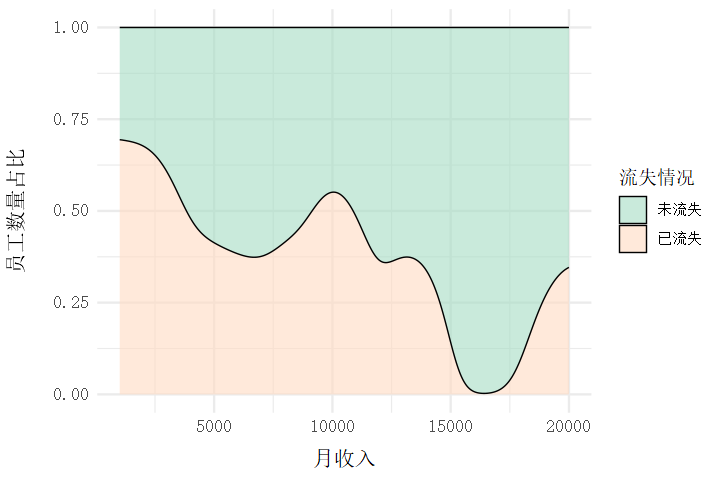

In [46]:
options(repr.plot.width=6, repr.plot.height=4) 

p1 <- 
  df_zh %>%
    ggplot(aes(x = 月收入, fill = 流失情况, group = 流失情况)) +
    geom_density(alpha=.6, size=.3, position="fill") +
    theme_minimal() +
    # 坐标轴标题
    labs(y=st_y_per) +
    # 填充颜色
    scale_fill_manual(values=c(red, green))+
    # 全图字体&字号
    theme(text = element_text(family = font, size=11)) +
    # 坐标轴外观
    theme(
      # 坐标轴标题距离其他元素间距&字号
      axis.title.x = element_text(margin = margin(t = 10, r = 0, b = 0, l = 0), size=12), 
      axis.title.y = element_text(margin = margin(t = 0, r = 15, b = 0, l = 0), size=12),
      # 坐标轴刻度字号
      axis.text = element_text(size = 10)) 

p1

## Basic factors -> Important factors
1. Demographic characteristics
2. Department and job role

### Demographic characteristics -> Overtime work

`summarise()` has grouped output by '性别'. You can override using the
`.groups` argument.


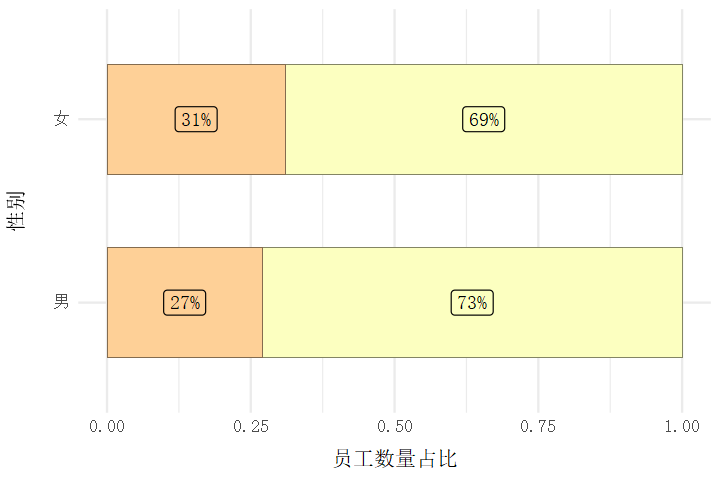

In [47]:
options(repr.plot.width=6, repr.plot.height=4) 

p1 <- 
  df_zh %>%
  select(性别, 是否加班) %>% 
  group_by(性别, 是否加班) %>% 
  summarize(n=n()) %>% 
  mutate(pct=round(prop.table(n),2) * 100) %>% 
  arrange(desc(pct)) %>%
    ggplot(aes(x=fct_reorder(性别,pct), y=pct, fill=是否加班, color=是否加班)) + 
    geom_bar(stat="identity", color="black", size=.1, width=.6, position="fill") +
    geom_label(aes(label=paste0(pct, "%"), fill = 是否加班), 
               color = "black", family = font, 
               position = position_fill(vjust = 0.5)) + 
    coord_flip() +
    theme_minimal() +
    # 坐标轴标题
    labs(y=st_y_per, x="性别") +
    # 填充颜色
    scale_fill_manual(values=c(yellow, brown))+
    # 全图字体&字号
    theme(text = element_text(family = font, size=11)) +
    # 坐标轴外观
    theme(
      # 坐标轴标题距离其他元素间距&字号
      axis.title.x = element_text(margin = margin(t = 10, r = 0, b = 0, l = 0), size=12), 
      axis.title.y = element_text(margin = margin(t = 0, r = 15, b = 0, l = 0), size=12),
      # 坐标轴刻度字号
      axis.text = element_text(size = 10)) +
    # 不显示图例
    theme(legend.position="none")
p1


`summarise()` has grouped output by '代际'. You can override using the
`.groups` argument.


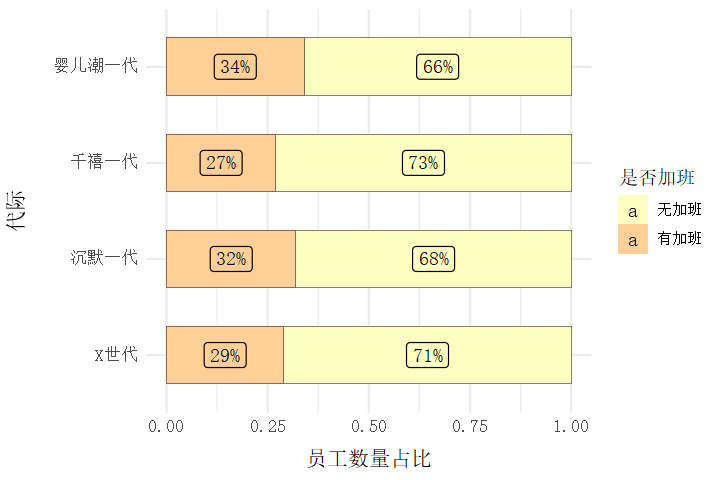

In [48]:
options(repr.plot.width=6, repr.plot.height=4) 

p2 <- 
  df_zh %>%
  select(代际, 是否加班) %>% 
  group_by(代际, 是否加班) %>% 
  summarize(n=n()) %>% 
  mutate(pct=round(prop.table(n),2) * 100) %>% 
  arrange(desc(pct)) %>%
    ggplot(aes(x=fct_reorder(代际,pct), y=pct, fill=是否加班, color=是否加班)) + 
    geom_bar(stat="identity", color="black", size=.1, width=.6, position="fill") +
    geom_label(aes(label=paste0(pct, "%"), fill = 是否加班), 
               color = "black", family = font, 
               position = position_fill(vjust = 0.5)) + 
    coord_flip() +
    theme_minimal() +
    # 坐标轴标题
    labs(y=st_y_per, x="代际") +
    # 填充颜色
    scale_fill_manual(values=c(yellow, brown))+
    # 全图字体&字号
    theme(text = element_text(family = font, size=11)) +
    # 坐标轴外观
    theme(
      # 坐标轴标题距离其他元素间距&字号
      axis.title.x = element_text(margin = margin(t = 10, r = 0, b = 0, l = 0), size=12), 
      axis.title.y = element_text(margin = margin(t = 0, r = 15, b = 0, l = 0), size=12),
      # 坐标轴刻度字号
      axis.text = element_text(size = 10))
p2

`summarise()` has grouped output by '婚姻状态'. You can override using the
`.groups` argument.


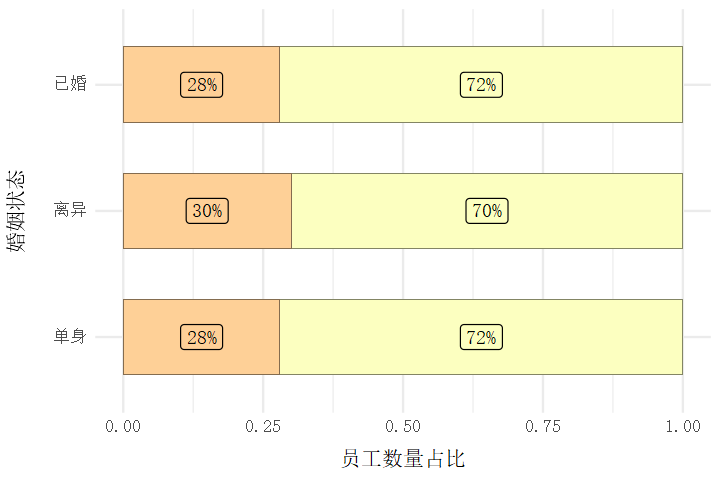

In [49]:
options(repr.plot.width=6, repr.plot.height=4) 

p3 <- 
  df_zh %>%
  select(婚姻状态, 是否加班) %>% 
  group_by(婚姻状态, 是否加班) %>% 
  summarize(n=n()) %>% 
  mutate(pct=round(prop.table(n),2) * 100) %>% 
  arrange(desc(pct)) %>%
    ggplot(aes(x=fct_reorder(婚姻状态,pct), y=pct, fill=是否加班, color=是否加班)) + 
    geom_bar(stat="identity", color="black", size=.1, width=.6, position="fill") +
    geom_label(aes(label=paste0(pct, "%"), fill = 是否加班), 
               color = "black", family = font, 
               position = position_fill(vjust = 0.5)) + 
    coord_flip() +
    theme_minimal() +
    # 坐标轴标题
    labs(y=st_y_per, x="婚姻状态") +
    # 填充颜色
    scale_fill_manual(values=c(yellow, brown))+
    # 全图字体&字号
    theme(text = element_text(family = font, size=11)) +
    # 坐标轴外观
    theme(
      # 坐标轴标题距离其他元素间距&字号
      axis.title.x = element_text(margin = margin(t = 10, r = 0, b = 0, l = 0), size=12), 
      axis.title.y = element_text(margin = margin(t = 0, r = 15, b = 0, l = 0), size=12),
      # 坐标轴刻度字号
      axis.text = element_text(size = 10)) +
    # 不显示图例
    theme(legend.position="none")
p3

`summarise()` has grouped output by '教育水平_文字'. You can override using the
`.groups` argument.


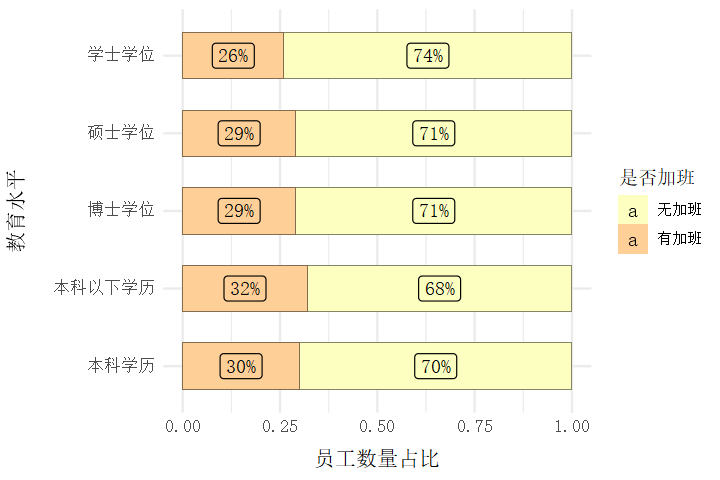

In [50]:
options(repr.plot.width=6, repr.plot.height=4) 

p4 <- 
  df_zh %>%
  select(教育水平_文字, 是否加班) %>% 
  group_by(教育水平_文字, 是否加班) %>% 
  summarize(n=n()) %>% 
  mutate(pct=round(prop.table(n),2) * 100) %>% 
  arrange(desc(pct)) %>%
    ggplot(aes(x=fct_reorder(教育水平_文字,pct), y=pct, fill=是否加班, color=是否加班)) + 
    geom_bar(stat="identity", color="black", size=.1, width=.6, position="fill") +
    geom_label(aes(label=paste0(pct, "%"), fill = 是否加班), 
               color = "black", family = font, 
               position = position_fill(vjust = 0.5)) + 
    coord_flip() +
    theme_minimal() +
    # 坐标轴标题
    labs(y=st_y_per, x="教育水平") +
    # 填充颜色
    scale_fill_manual(values=c(yellow, brown))+
    # 全图字体&字号
    theme(text = element_text(family = font, size=11)) +
    # 坐标轴外观
    theme(
      # 坐标轴标题距离其他元素间距&字号
      axis.title.x = element_text(margin = margin(t = 10, r = 0, b = 0, l = 0), size=12), 
      axis.title.y = element_text(margin = margin(t = 0, r = 15, b = 0, l = 0), size=12),
      # 坐标轴刻度字号
      axis.text = element_text(size = 10))
p4

Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
"conversion failure on '是否加班' in 'mbcsToSbcs': dot substituted for <e6>"
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
"conversion failure on '是否加班' in 'mbcsToSbcs': dot substituted for <98>"
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
"conversion failure on '是否加班' in 'mbcsToSbcs': dot substituted for <af>"
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
"conversion failure on '是否加班' in 'mbcsToSbcs': dot substituted for <e5>"
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
"conversion failure on '是否加班' in 'mbcsToSbcs': dot substituted for <90>"
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
"conversion failure on '是否加班' in 'mbcsToSbcs': dot substituted for <a6>"
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), 

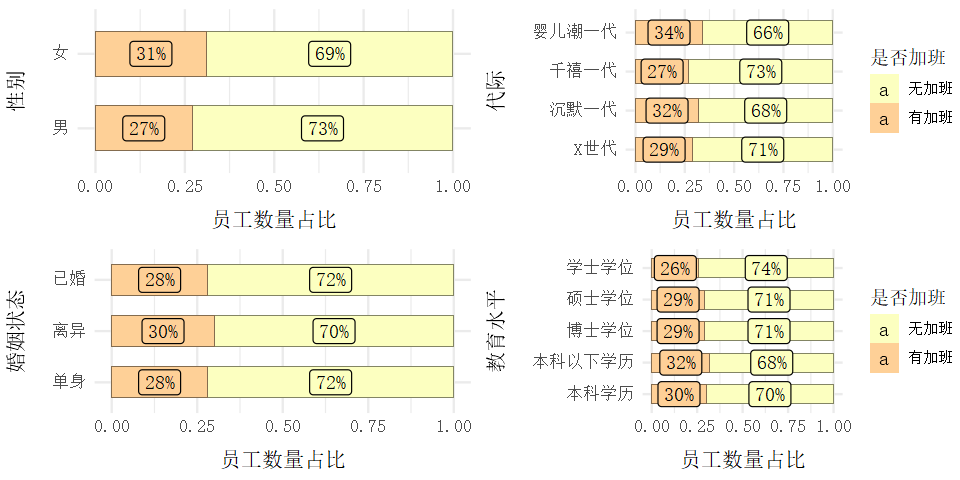

In [52]:
options(repr.plot.width=8, repr.plot.height=4) 

plot_grid(p1, p2, p3, p4, ncol=2, nrow=2)

### Demographic characteristics -> Monthly income

Warning message:
"The `size` argument of `element_rect()` is deprecated as of ggplot2 3.4.0.
ℹ Please use the `linewidth` argument instead."


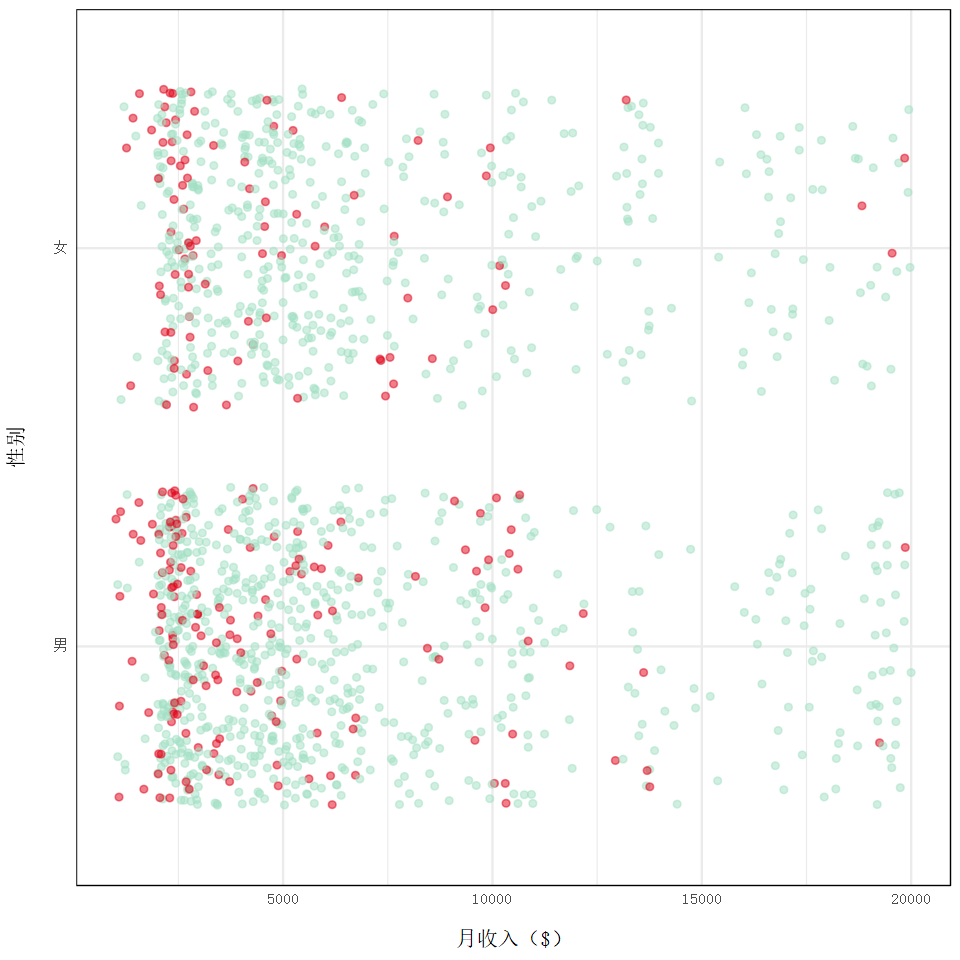

In [53]:
options(repr.plot.width=8, repr.plot.height=8) 

p1 <- df_zh %>% 
select(流失情况, 月收入, 性别) %>% 
ggplot(aes(x=月收入, y=性别)) + 
geom_jitter(aes(col=流失情况), alpha=0.5) + 
scale_color_manual(values=c("#a1dfc3", darkred)) + 
labs(x="月收入（$）") + 
theme_minimal() + 
theme(text = element_text(family = font, size=11),
      panel.border = element_rect(color = "black", fill = NA, size = 0.3),
      axis.title.x = element_text(margin = margin(t = 15, r = 0, b = 0, l = 0), size=12), 
      axis.title.y = element_text(margin = margin(t = 0, r = 15, b = 0, l = 0), size=12)) +
# 不显示图例
theme(legend.position="none")

p1

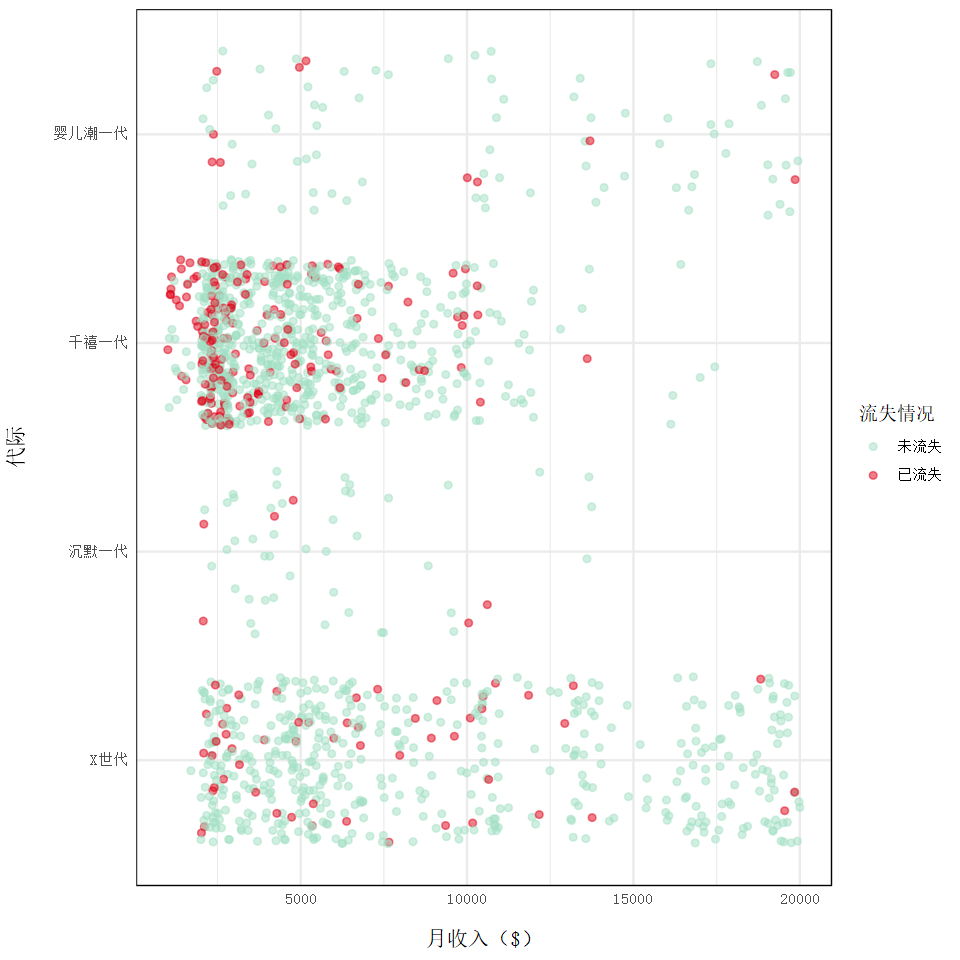

In [54]:
options(repr.plot.width=8, repr.plot.height=8) 

p2 <- df_zh %>% 
select(流失情况, 月收入, 代际) %>% 
ggplot(aes(x=月收入, y=代际)) + 
geom_jitter(aes(col=流失情况), alpha=0.5) + 
scale_color_manual(values=c("#a1dfc3", darkred)) + 
labs(x="月收入（$）") + 
theme_minimal() + 
theme(text = element_text(family = font, size=11),
      panel.border = element_rect(color = "black", fill = NA, size = 0.3),
      axis.title.x = element_text(margin = margin(t = 15, r = 0, b = 0, l = 0), size=12), 
      axis.title.y = element_text(margin = margin(t = 0, r = 15, b = 0, l = 0), size=12))

p2

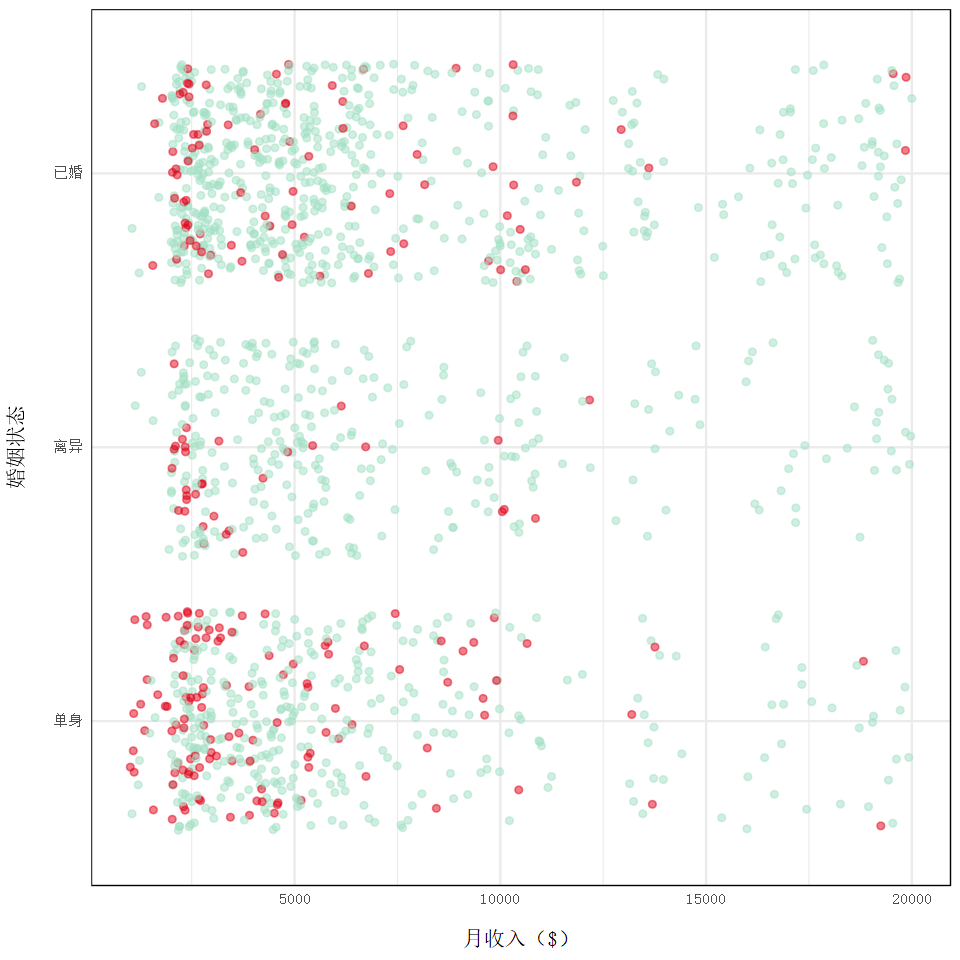

In [55]:
options(repr.plot.width=8, repr.plot.height=8) 

p3 <- df_zh %>% 
select(流失情况, 月收入, 婚姻状态) %>% 
ggplot(aes(x=月收入, y=婚姻状态)) + 
geom_jitter(aes(col=流失情况), alpha=0.5) + 
scale_color_manual(values=c("#a1dfc3", darkred)) + 
labs(x="月收入（$）") + 
theme_minimal() + 
theme(text = element_text(family = font, size=11),
      panel.border = element_rect(color = "black", fill = NA, size = 0.3),
      axis.title.x = element_text(margin = margin(t = 15, r = 0, b = 0, l = 0), size=12), 
      axis.title.y = element_text(margin = margin(t = 0, r = 15, b = 0, l = 0), size=12)) +
# 不显示图例
theme(legend.position="none")

p3

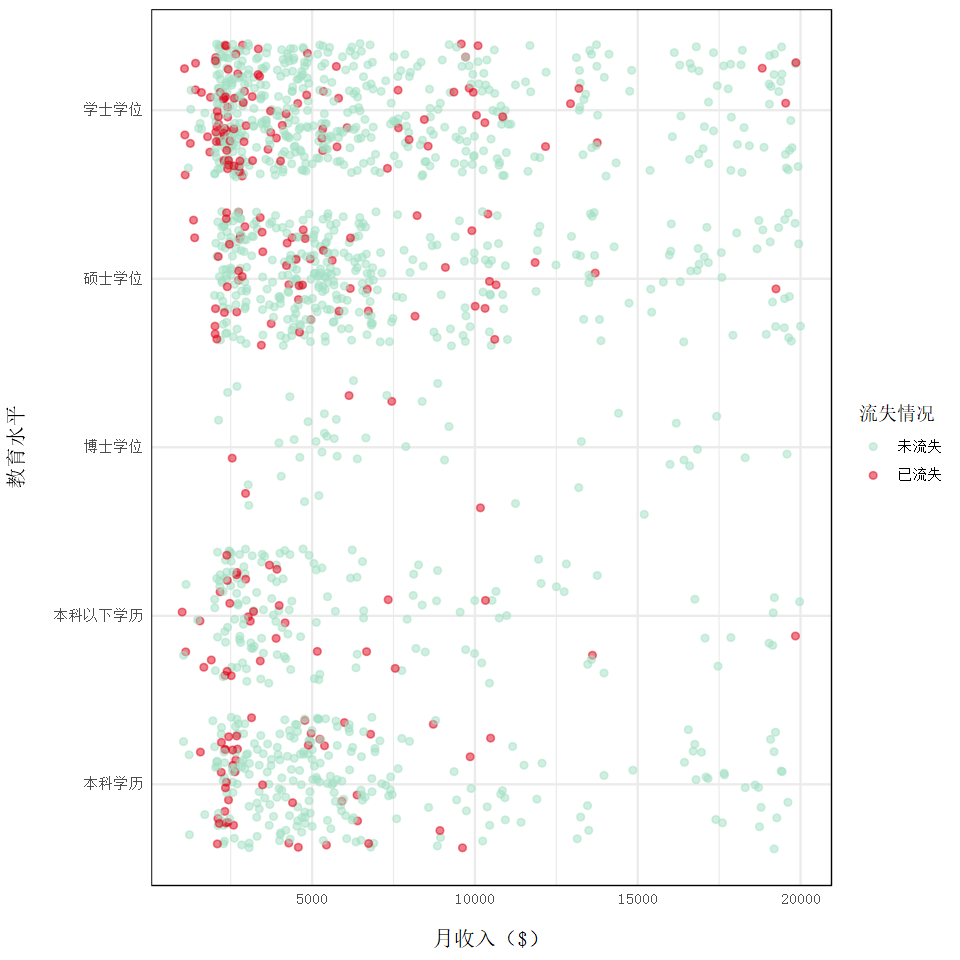

In [56]:
options(repr.plot.width=8, repr.plot.height=8) 

p4 <- df_zh %>% 
select(流失情况, 月收入, 教育水平_文字) %>% 
ggplot(aes(x=月收入, y=教育水平_文字)) + 
geom_jitter(aes(col=流失情况), alpha=0.5) + 
scale_color_manual(values=c("#a1dfc3", darkred)) + 
labs(x="月收入（$）", y="教育水平") + 
theme_minimal() + 
theme(text = element_text(family = font, size=11),
      panel.border = element_rect(color = "black", fill = NA, size = 0.3),
      axis.title.x = element_text(margin = margin(t = 15, r = 0, b = 0, l = 0), size=12), 
      axis.title.y = element_text(margin = margin(t = 0, r = 15, b = 0, l = 0), size=12))

p4


Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
"conversion failure on '流失情况' in 'mbcsToSbcs': dot substituted for <e6>"
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
"conversion failure on '流失情况' in 'mbcsToSbcs': dot substituted for <b5>"
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
"conversion failure on '流失情况' in 'mbcsToSbcs': dot substituted for <81>"
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
"conversion failure on '流失情况' in 'mbcsToSbcs': dot substituted for <e5>"
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
"conversion failure on '流失情况' in 'mbcsToSbcs': dot substituted for <a4>"
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
"conversion failure on '流失情况' in 'mbcsToSbcs': dot substituted for <b1>"
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), 

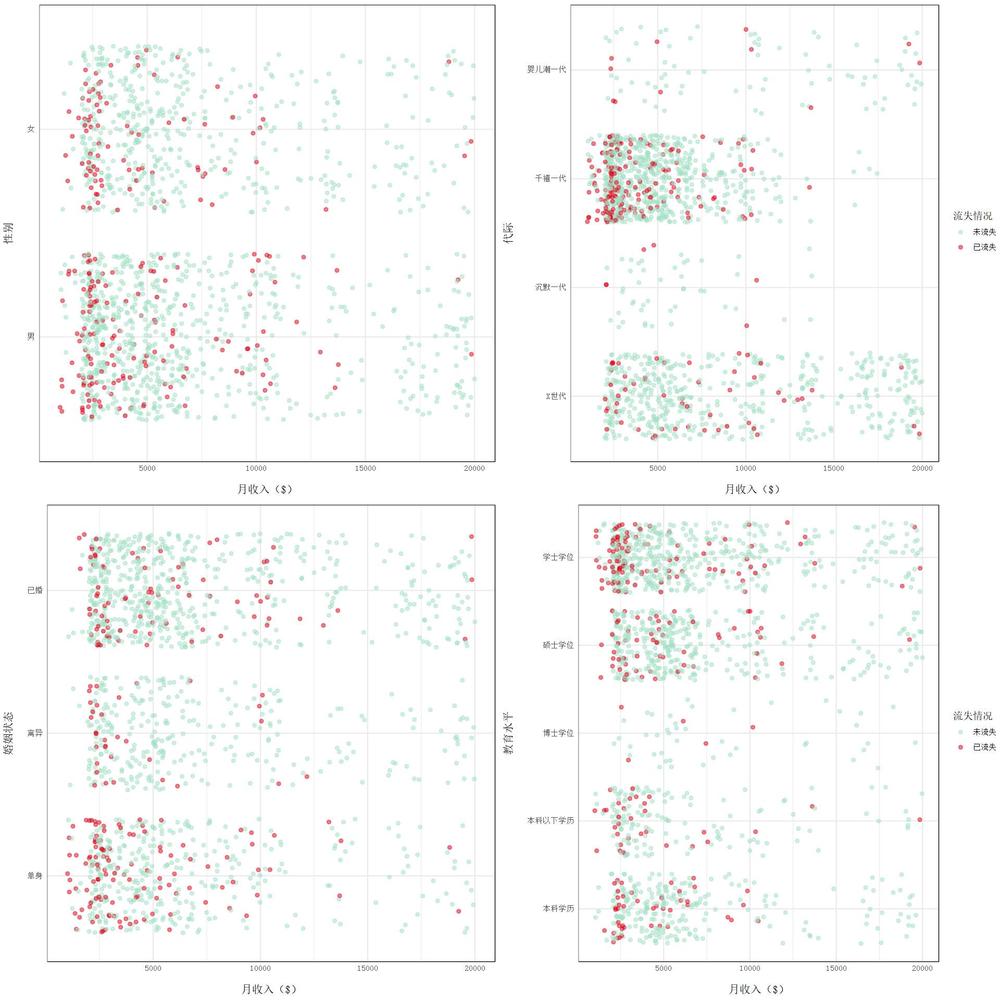

In [57]:
options(repr.plot.width=16, repr.plot.height=16) 

plot_grid(p1, p2, p3, p4, ncol=2, nrow=2)

### Department and job role -> Overtime work

`summarise()` has grouped output by '所属部门'. You can override using the
`.groups` argument.


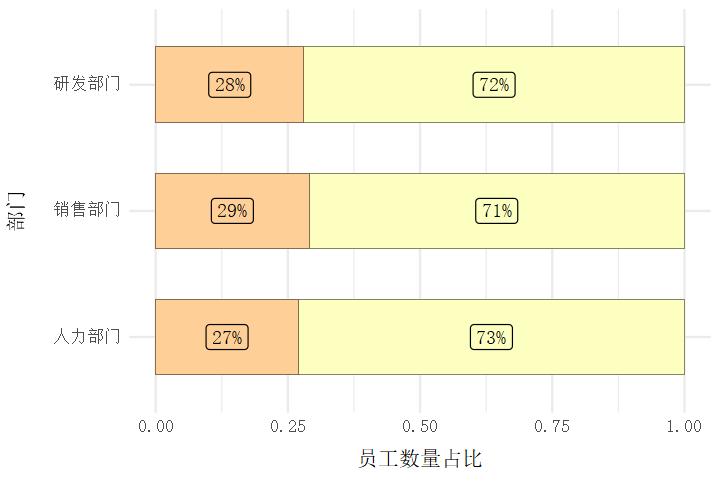

In [58]:
options(repr.plot.width=6, repr.plot.height=4) 

p1 <- 
  df_zh %>%
  select(所属部门, 是否加班) %>% 
  group_by(所属部门, 是否加班) %>% 
  summarize(n=n()) %>% 
  mutate(pct=round(prop.table(n),2) * 100) %>% 
  arrange(desc(pct)) %>%
    ggplot(aes(x=fct_reorder(所属部门,pct), y=pct, fill=是否加班, color=是否加班)) + 
    geom_bar(stat="identity", color="black", size=.1, width=.6, position="fill") +
    geom_label(aes(label=paste0(pct, "%"), fill = 是否加班), 
               color = "black", family = font, 
               position = position_fill(vjust = 0.5)) + 
    coord_flip() +
    theme_minimal() +
    # 坐标轴标题
    labs(y=st_y_per, x="部门") +
    # 填充颜色
    scale_fill_manual(values=c(yellow, brown))+
    # 全图字体&字号
    theme(text = element_text(family = font, size=11)) +
    # 坐标轴外观
    theme(
      # 坐标轴标题距离其他元素间距&字号
      axis.title.x = element_text(margin = margin(t = 10, r = 0, b = 0, l = 0), size=12), 
      axis.title.y = element_text(margin = margin(t = 0, r = 15, b = 0, l = 0), size=12),
      # 坐标轴刻度字号
      axis.text = element_text(size = 10)) +
    # 不显示图例
    theme(legend.position="none")
p1

`summarise()` has grouped output by '岗位名称'. You can override using the
`.groups` argument.


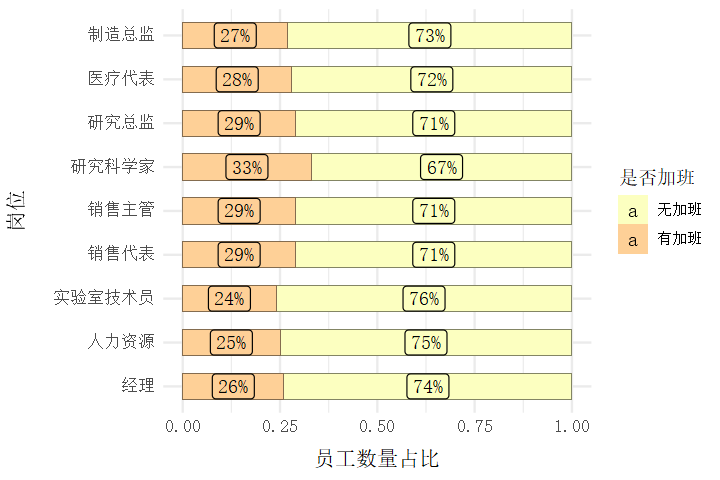

In [59]:
options(repr.plot.width=6, repr.plot.height=4) 

p2 <- 
  df_zh %>%
  select(岗位名称, 是否加班) %>% 
  group_by(岗位名称, 是否加班) %>% 
  summarize(n=n()) %>% 
  mutate(pct=round(prop.table(n),2) * 100) %>% 
  arrange(desc(pct)) %>%
    ggplot(aes(x=fct_reorder(岗位名称,pct), y=pct, fill=是否加班, color=是否加班)) + 
    geom_bar(stat="identity", color="black", size=.1, width=.6, position="fill") +
    geom_label(aes(label=paste0(pct, "%"), fill = 是否加班), 
               color = "black", family = font, 
               position = position_fill(vjust = 0.5)) + 
    coord_flip() +
    theme_minimal() +
    # 坐标轴标题
    labs(y=st_y_per, x="岗位") +
    # 填充颜色
    scale_fill_manual(values=c(yellow, brown))+
    # 全图字体&字号
    theme(text = element_text(family = font, size=11)) +
    # 坐标轴外观
    theme(
      # 坐标轴标题距离其他元素间距&字号
      axis.title.x = element_text(margin = margin(t = 10, r = 0, b = 0, l = 0), size=12), 
      axis.title.y = element_text(margin = margin(t = 0, r = 15, b = 0, l = 0), size=12),
      # 坐标轴刻度字号
      axis.text = element_text(size = 10))
p2

Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
"conversion failure on '是否加班' in 'mbcsToSbcs': dot substituted for <e6>"
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
"conversion failure on '是否加班' in 'mbcsToSbcs': dot substituted for <98>"
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
"conversion failure on '是否加班' in 'mbcsToSbcs': dot substituted for <af>"
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
"conversion failure on '是否加班' in 'mbcsToSbcs': dot substituted for <e5>"
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
"conversion failure on '是否加班' in 'mbcsToSbcs': dot substituted for <90>"
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
"conversion failure on '是否加班' in 'mbcsToSbcs': dot substituted for <a6>"
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), 

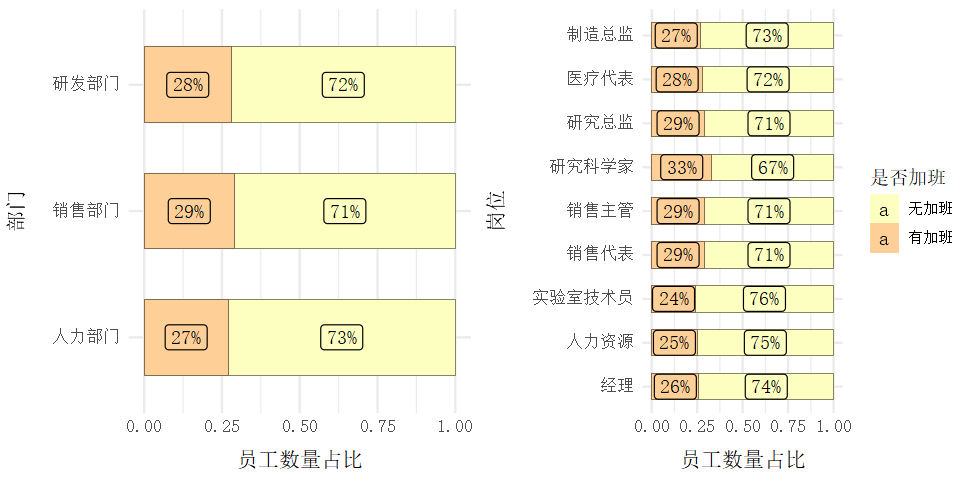

In [60]:
options(repr.plot.width=8, repr.plot.height=4) 

plot_grid(p1, p2, ncol=2)

### Department and job role -> Monthly income

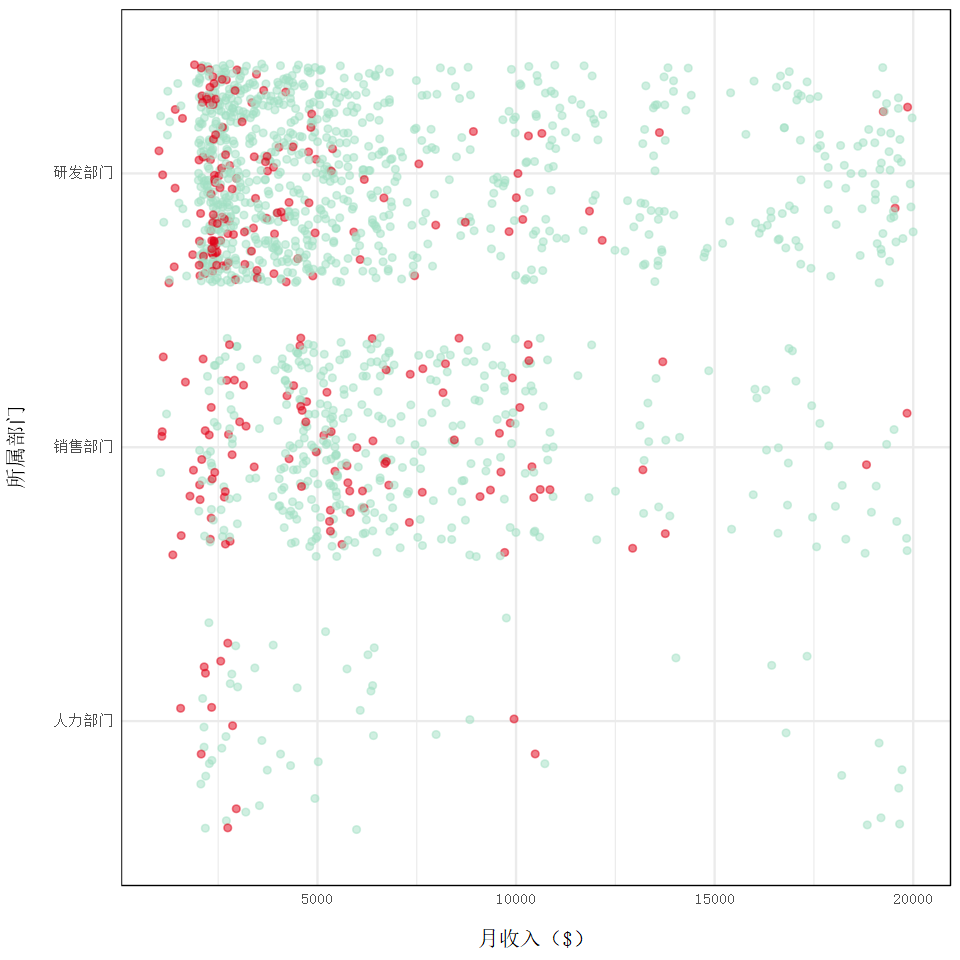

In [62]:
options(repr.plot.width=8, repr.plot.height=8) 

p1_1 <- df_zh %>% 
select(流失情况, 所属部门, 月收入) %>% 
ggplot(aes(x=月收入, y=所属部门)) + 
geom_jitter(aes(col=流失情况), alpha=0.5) + 
scale_color_manual(values=c("#a1dfc3", darkred)) + 
labs(y="所属部门", x="月收入（$）") + 
theme_minimal() + 
theme(text = element_text(family = font, size=11),
      panel.border = element_rect(color = "black", fill = NA, size = 0.3),
      axis.title.x = element_text(margin = margin(t = 15, r = 0, b = 0, l = 0), size=12), 
      axis.title.y = element_text(margin = margin(t = 0, r = 15, b = 0, l = 0), size=12)) +
# 不显示图例
theme(legend.position="none")

p1_1

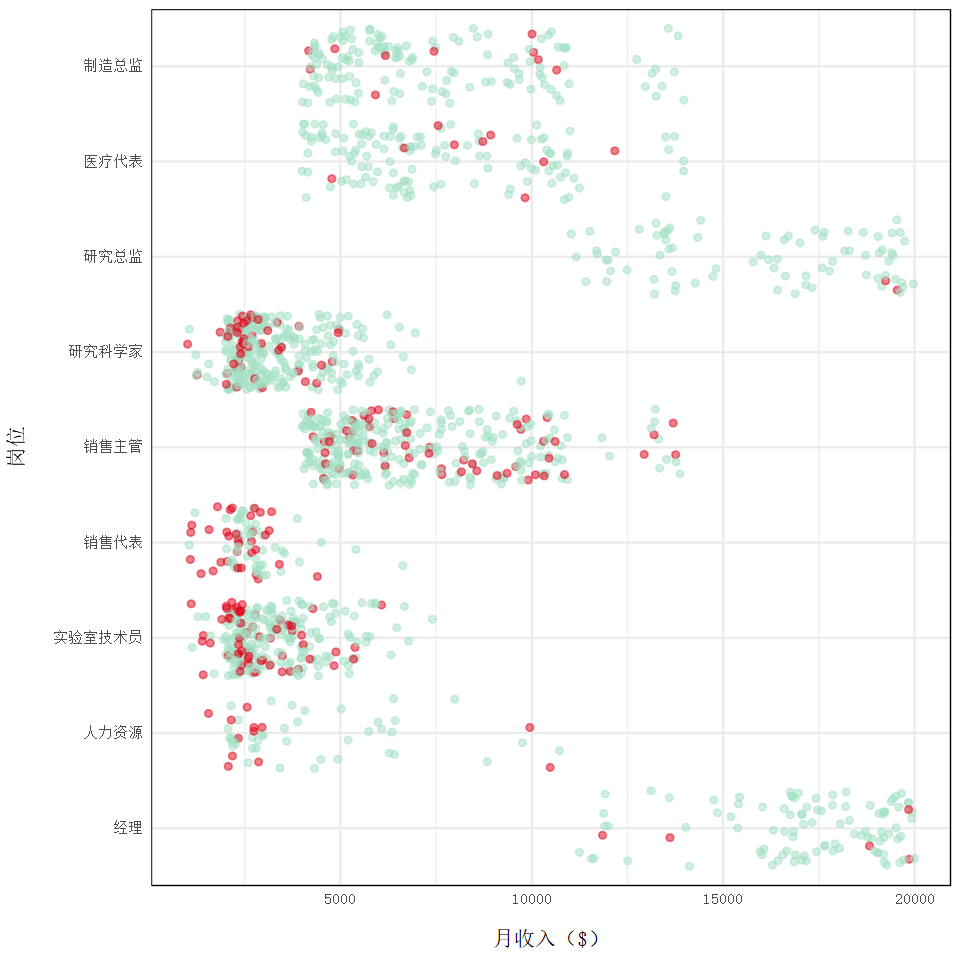

In [63]:
options(repr.plot.width=8, repr.plot.height=8) 

p1_1 <- df_zh %>% 
select(流失情况, 岗位名称, 月收入) %>% 
ggplot(aes(x=月收入, y=岗位名称)) + 
geom_jitter(aes(col=流失情况), alpha=0.5) + 
scale_color_manual(values=c("#a1dfc3", darkred)) + 
labs(y="岗位", x="月收入（$）") + 
theme_minimal() + 
theme(text = element_text(family = font, size=11),
      panel.border = element_rect(color = "black", fill = NA, size = 0.3),
      axis.title.x = element_text(margin = margin(t = 15, r = 0, b = 0, l = 0), size=12), 
      axis.title.y = element_text(margin = margin(t = 0, r = 15, b = 0, l = 0), size=12)) +
# 不显示图例
theme(legend.position="none")

p1_1

Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
"conversion failure on '流失情况' in 'mbcsToSbcs': dot substituted for <e6>"
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
"conversion failure on '流失情况' in 'mbcsToSbcs': dot substituted for <b5>"
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
"conversion failure on '流失情况' in 'mbcsToSbcs': dot substituted for <81>"
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
"conversion failure on '流失情况' in 'mbcsToSbcs': dot substituted for <e5>"
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
"conversion failure on '流失情况' in 'mbcsToSbcs': dot substituted for <a4>"
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
"conversion failure on '流失情况' in 'mbcsToSbcs': dot substituted for <b1>"
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), 

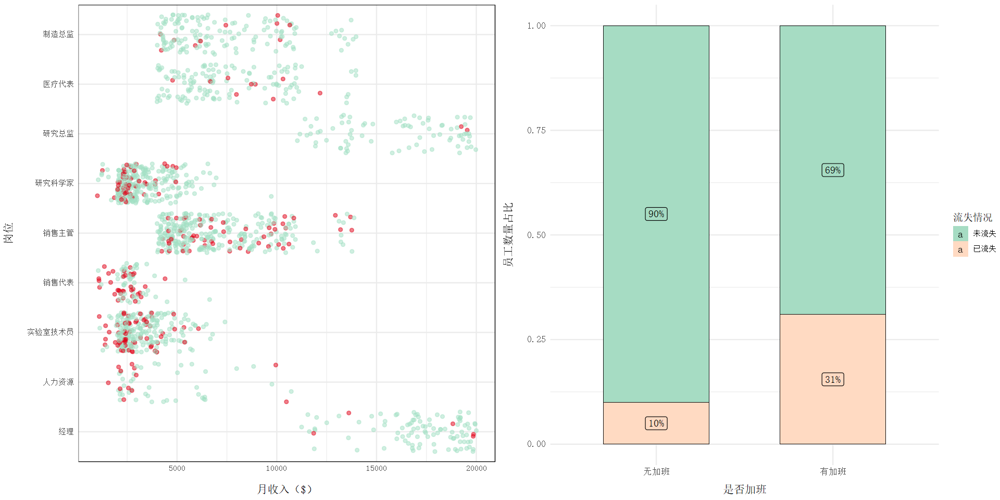

In [64]:
options(repr.plot.width=16, repr.plot.height=8) 

plot_grid(p1_1, p1_2, ncol=2)

## Correlation coefficient analysis
1. Draw the correlation matrix
2. Bivariate analysis

### Draw the correlation matrix

In [65]:
options(repr.plot.width=13, repr.plot.height=10) 
# 筛选数值列
nums <- select_if(df_train, is.numeric)
#计算相关系数
corr <- round(cor(nums), 1)
# 记录显著差异
p.mat <- cor_pmat(nums)

Warning message in stats::cor(x, ...):
"the standard deviation is zero"


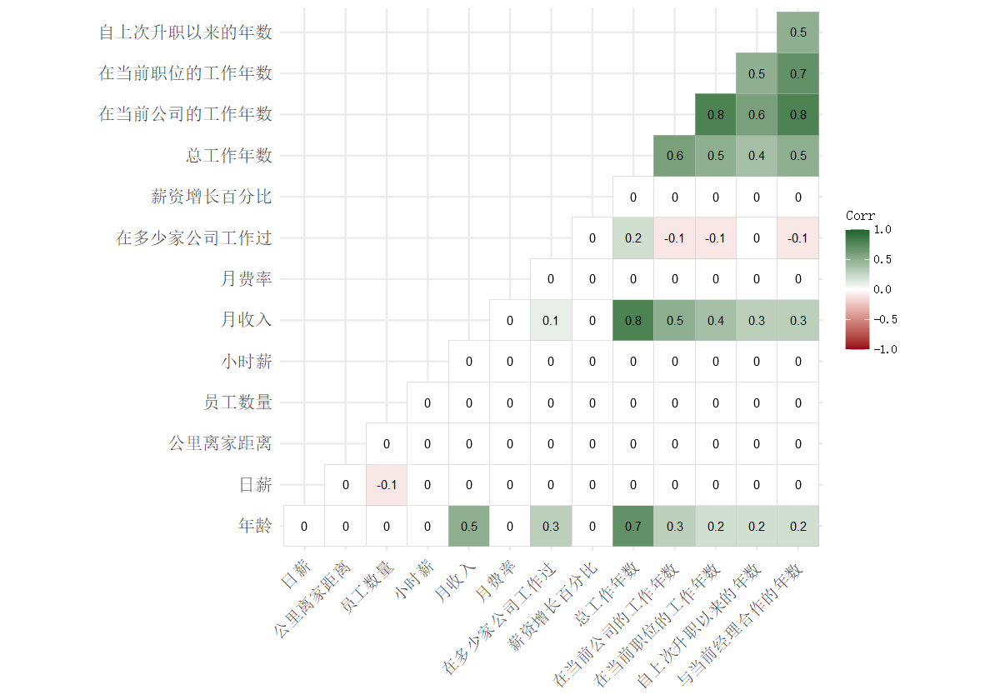

In [66]:
options(repr.plot.width=10, repr.plot.height=7) 

nums <- select_if(df_zh, is.numeric)

corr <- round(cor(nums), 1)

ggcorrplot(corr, 
           type = "lower", 
           lab = TRUE, 
           lab_size = 3, 
           method="square", 
           colors = c("#95001c", "white", "#1c642d"),
           ggtheme=theme_minimal()) + 
theme(text = element_text(family = font, size=10))

### Bivariate analysis

`geom_smooth()` using formula = 'y ~ x'


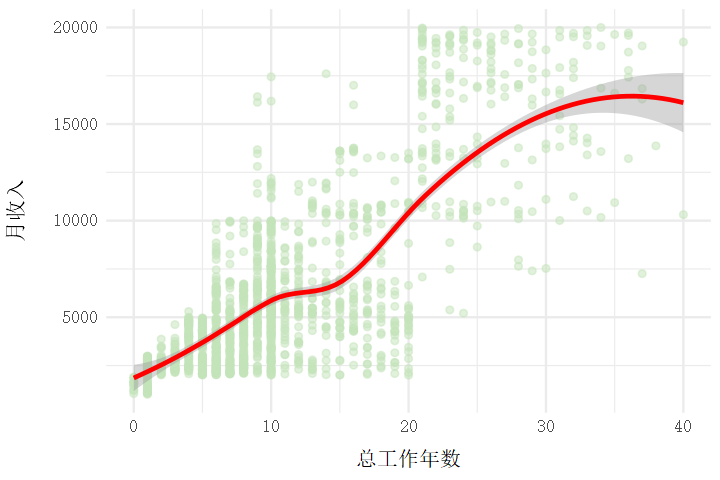

In [67]:
options(repr.plot.width=6, repr.plot.height=4) 

    p1 <- df_zh %>% 
    ggplot(aes(x=总工作年数, y=月收入)) + 
    geom_point(color = "#c4e3ba", alpha=1/2) +
    geom_smooth(method="loess", color="red") + 
theme_minimal() +
theme(# 全图字体&字号
      text = element_text(family = font, size=11),
      # 坐标轴标题距离其他元素间距&字号
      axis.title.x = element_text(margin = margin(t = 10, r = 0, b = 0, l = 0), size=12), 
      axis.title.y = element_text(margin = margin(t = 0, r = 15, b = 0, l = 0), size=12),
      # 坐标轴刻度字号
      axis.text = element_text(size = 10))
p1

`geom_smooth()` using formula = 'y ~ x'


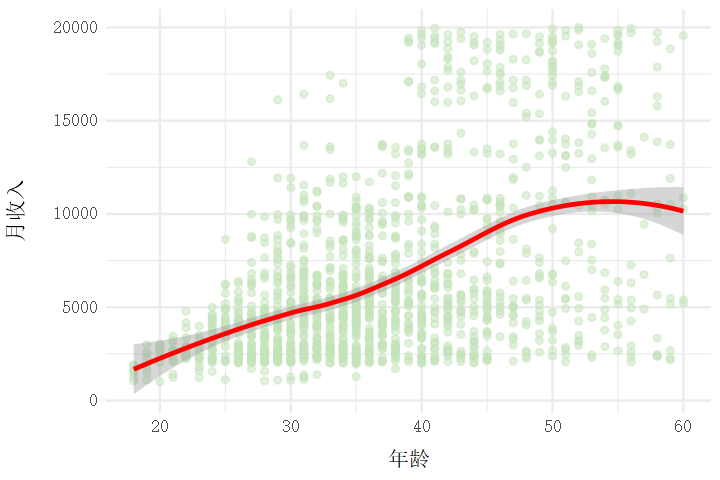

In [68]:
options(repr.plot.width=6, repr.plot.height=4) 

p2 <- df_zh %>% 
ggplot(aes(x=年龄, y=月收入)) + 
geom_point(color = "#c4e3ba", alpha=1/2) +
geom_smooth(method="loess", color="red") + 
theme_minimal() +
theme(# 全图字体&字号
      text = element_text(family = font, size=11),
      # 坐标轴标题距离其他元素间距&字号
      axis.title.x = element_text(margin = margin(t = 10, r = 0, b = 0, l = 0), size=12), 
      axis.title.y = element_text(margin = margin(t = 0, r = 15, b = 0, l = 0), size=12),
      # 坐标轴刻度字号
      axis.text = element_text(size = 10))
p2

`geom_smooth()` using formula = 'y ~ x'


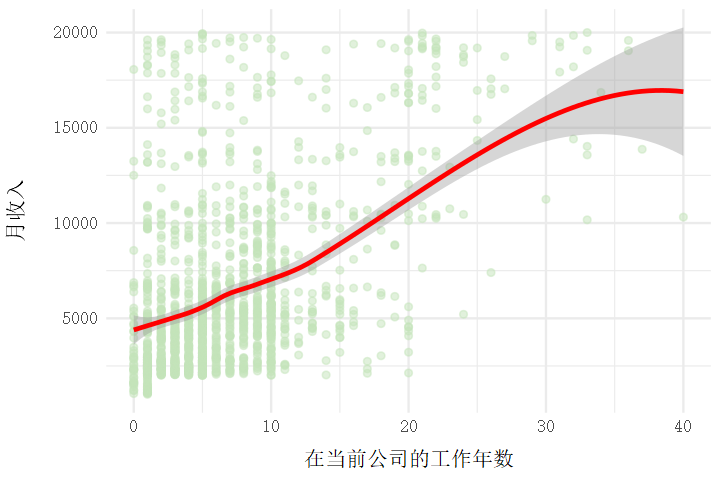

In [69]:
options(repr.plot.width=6, repr.plot.height=4) 

p3 <- df_zh %>% 
ggplot(aes(x=在当前公司的工作年数, y=月收入)) + 
geom_point(color = "#c4e3ba", alpha=1/2) +
geom_smooth(method="loess", color="red") + 
theme_minimal() +
theme(# 全图字体&字号
      text = element_text(family = font, size=11),
      # 坐标轴标题距离其他元素间距&字号
      axis.title.x = element_text(margin = margin(t = 10, r = 0, b = 0, l = 0), size=12), 
      axis.title.y = element_text(margin = margin(t = 0, r = 15, b = 0, l = 0), size=12),
      # 坐标轴刻度字号
      axis.text = element_text(size = 10))
p3

`geom_smooth()` using formula = 'y ~ x'


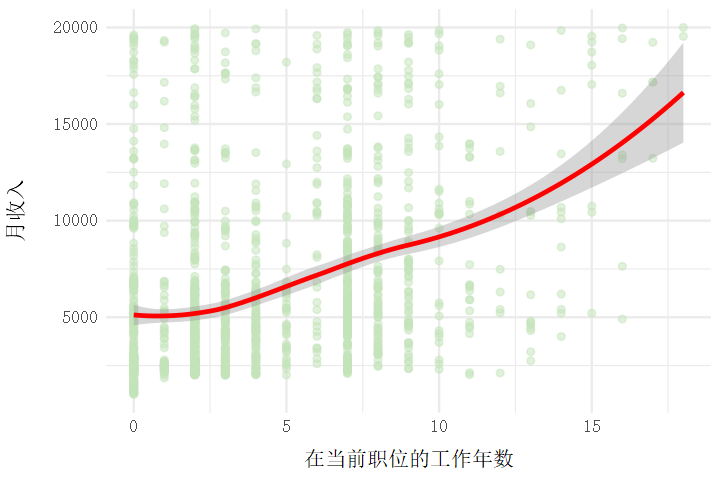

In [70]:
options(repr.plot.width=6, repr.plot.height=4) 

p4 <- df_zh %>% 
ggplot(aes(x=在当前职位的工作年数, y=月收入)) + 
geom_point(color = "#c4e3ba", alpha=1/2) +
geom_smooth(method="loess", color="red") + 
theme_minimal() +
theme(# 全图字体&字号
      text = element_text(family = font, size=11),
      # 坐标轴标题距离其他元素间距&字号
      axis.title.x = element_text(margin = margin(t = 10, r = 0, b = 0, l = 0), size=12), 
      axis.title.y = element_text(margin = margin(t = 0, r = 15, b = 0, l = 0), size=12),
      # 坐标轴刻度字号
      axis.text = element_text(size = 10))
p4

`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


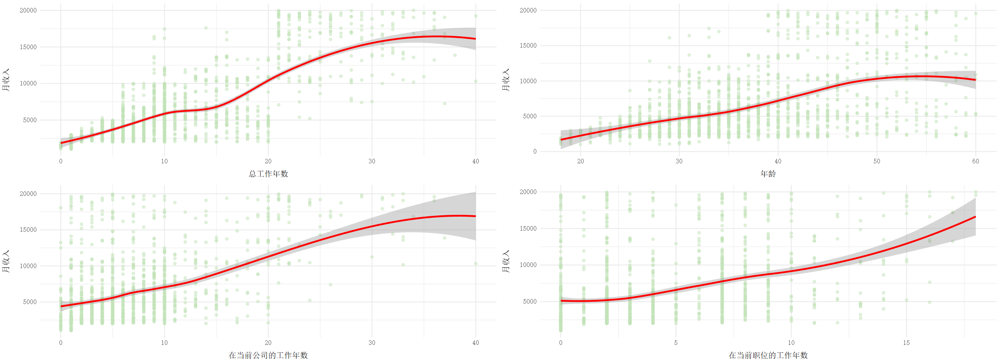

In [71]:
options(repr.plot.width=22, repr.plot.height=8) 

plot_grid(p1, p2, p3, p4, ncol=2, nrow=2)

# Satisfaction analysis
1. Satisfaction -> Attrition
2. Department and job role -> Satisfaction

## Satisfaction -> Attrition

`summarise()` has grouped output by '环境满意度'. You can override using the
`.groups` argument.


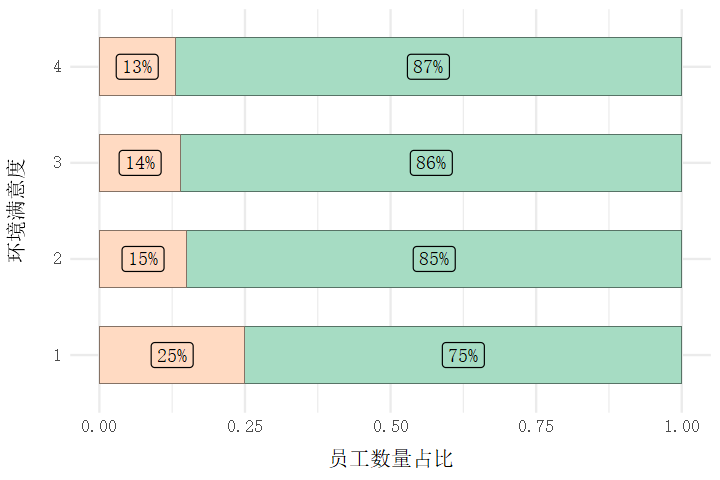

In [72]:
options(repr.plot.width=6, repr.plot.height=4) 

p1 <- 
  df_zh %>%
  select(环境满意度, 流失情况) %>% 
  group_by(环境满意度, 流失情况) %>% 
  summarize(n=n()) %>% 
  mutate(pct=round(prop.table(n),2) * 100) %>% 
  arrange(desc(pct)) %>%
    ggplot(aes(x=环境满意度, y=pct, fill=流失情况, color=流失情况)) + 
    geom_bar(stat="identity", color="black", size=.1, width=.6, position="fill") +
    geom_label(aes(label=paste0(pct, "%"), fill = 流失情况), 
               color = "black", family = font, 
               position = position_fill(vjust = 0.5)) + 
    coord_flip() +
    theme_minimal() +
    # 坐标轴标题
    labs(y=st_y_per) +
    # 填充颜色
    scale_fill_manual(values=c(red, green))+
    # 全图字体&字号
    theme(text = element_text(family = font, size=11)) +
    # 坐标轴外观
    theme(
      # 坐标轴标题距离其他元素间距&字号
      axis.title.x = element_text(margin = margin(t = 10, r = 0, b = 0, l = 0), size=12), 
      axis.title.y = element_text(margin = margin(t = 0, r = 15, b = 0, l = 0), size=12),
      # 坐标轴刻度字号
      axis.text = element_text(size = 10)) +
    # 不显示图例
    theme(legend.position="none")
p1

`summarise()` has grouped output by '人际关系满意度'. You can override using
the `.groups` argument.


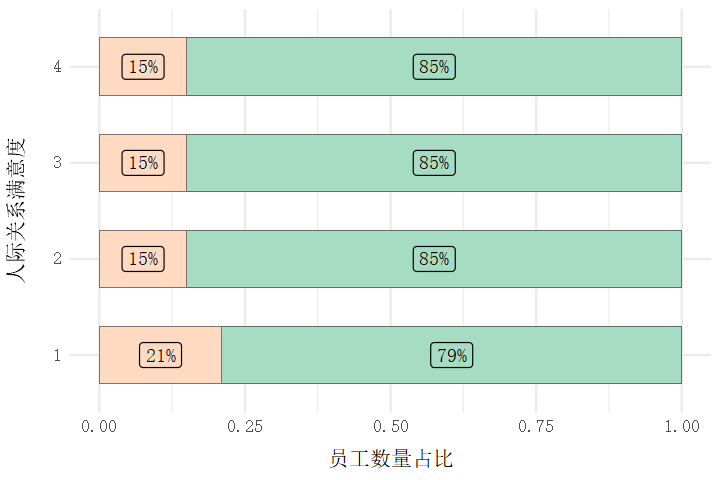

In [73]:
options(repr.plot.width=6, repr.plot.height=4) 

p2 <- 
  df_zh %>%
  select(人际关系满意度, 流失情况) %>% 
  group_by(人际关系满意度, 流失情况) %>% 
  summarize(n=n()) %>% 
  mutate(pct=round(prop.table(n),2) * 100) %>% 
  arrange(desc(pct)) %>%
    ggplot(aes(x=人际关系满意度, y=pct, fill=流失情况, color=流失情况)) + 
    geom_bar(stat="identity", color="black", size=.1, width=.6, position="fill") +
    geom_label(aes(label=paste0(pct, "%"), fill = 流失情况), 
               color = "black", family = font, 
               position = position_fill(vjust = 0.5)) + 
    coord_flip() +
    theme_minimal() +
    # 坐标轴标题
    labs(y=st_y_per) +
    # 填充颜色
    scale_fill_manual(values=c(red, green))+
    # 全图字体&字号
    theme(text = element_text(family = font, size=11)) +
    # 坐标轴外观
    theme(
      # 坐标轴标题距离其他元素间距&字号
      axis.title.x = element_text(margin = margin(t = 10, r = 0, b = 0, l = 0), size=12), 
      axis.title.y = element_text(margin = margin(t = 0, r = 15, b = 0, l = 0), size=12),
      # 坐标轴刻度字号
      axis.text = element_text(size = 10)) +
    # 不显示图例
    theme(legend.position="none")
p2

`summarise()` has grouped output by '工作满意度'. You can override using the
`.groups` argument.


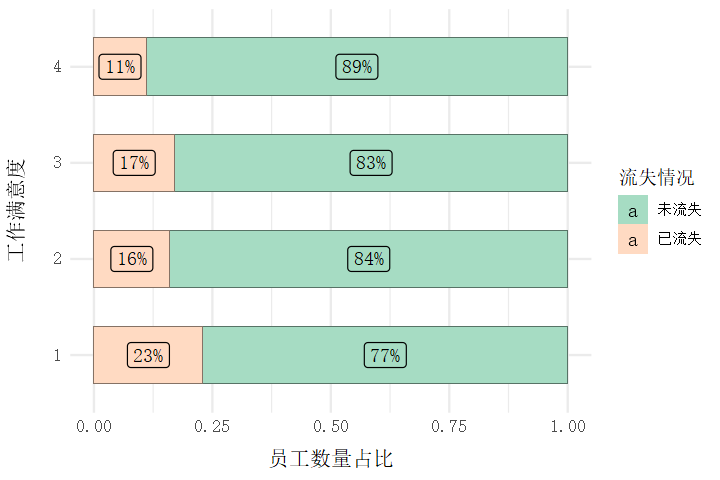

In [74]:
options(repr.plot.width=6, repr.plot.height=4) 

p3 <- 
  df_zh %>%
  select(工作满意度, 流失情况) %>% 
  group_by(工作满意度, 流失情况) %>% 
  summarize(n=n()) %>% 
  mutate(pct=round(prop.table(n),2) * 100) %>% 
  arrange(desc(pct)) %>%
    ggplot(aes(x=工作满意度, y=pct, fill=流失情况, color=流失情况)) + 
    geom_bar(stat="identity", color="black", size=.1, width=.6, position="fill") +
    geom_label(aes(label=paste0(pct, "%"), fill = 流失情况), 
               color = "black", family = font, 
               position = position_fill(vjust = 0.5)) + 
    coord_flip() +
    theme_minimal() +
    # 坐标轴标题
    labs(y=st_y_per) +
    # 填充颜色
    scale_fill_manual(values=c(red, green))+
    # 全图字体&字号
    theme(text = element_text(family = font, size=11)) +
    # 坐标轴外观
    theme(
      # 坐标轴标题距离其他元素间距&字号
      axis.title.x = element_text(margin = margin(t = 10, r = 0, b = 0, l = 0), size=12), 
      axis.title.y = element_text(margin = margin(t = 0, r = 15, b = 0, l = 0), size=12),
      # 坐标轴刻度字号
      axis.text = element_text(size = 10))
p3

Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
"conversion failure on '流失情况' in 'mbcsToSbcs': dot substituted for <e6>"
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
"conversion failure on '流失情况' in 'mbcsToSbcs': dot substituted for <b5>"
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
"conversion failure on '流失情况' in 'mbcsToSbcs': dot substituted for <81>"
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
"conversion failure on '流失情况' in 'mbcsToSbcs': dot substituted for <e5>"
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
"conversion failure on '流失情况' in 'mbcsToSbcs': dot substituted for <a4>"
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
"conversion failure on '流失情况' in 'mbcsToSbcs': dot substituted for <b1>"
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), 

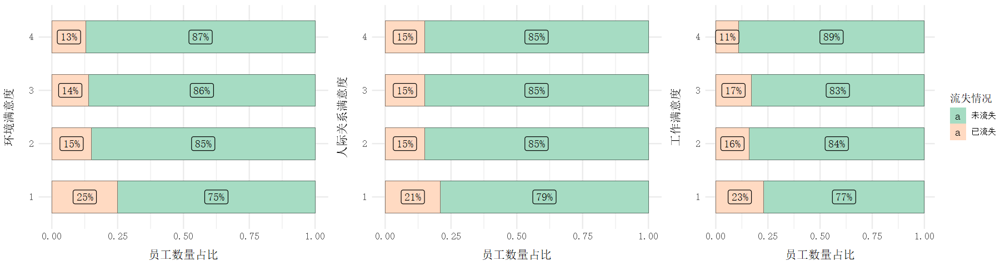

In [75]:
options(repr.plot.width=15, repr.plot.height=4) 

plot_grid(p1, p2, p3, ncol=3)

## Department and job role -> Satisfaction

In [77]:
df_zh <- original_df_zh

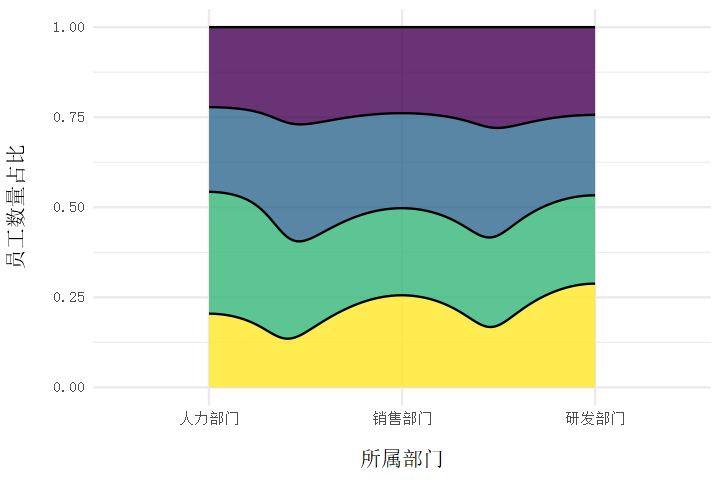

In [78]:
options(repr.plot.width=6, repr.plot.height=4) 

p_b_h <- df_zh %>% 
ggplot(aes(x=所属部门, group=环境满意度, fill=环境满意度)) +
geom_density(adjust=1.5, position="fill", size=0.5) + 
# 颜色集
scale_fill_viridis(alpha=0.8) +
theme_minimal() + 
# 设置图例顺序
guides(fill = guide_legend(reverse=FALSE)) +
labs(y=st_y_per) +
theme(text = element_text(family = font, size=11),
      axis.title.x = element_text(margin = margin(t = 15, r = 0, b = 0, l = 0), size=12), 
      axis.title.y = element_text(margin = margin(t = 0, r = 15, b = 0, l = 0), size=12)) +
# 不显示图例
theme(legend.position="none") 
p_b_h

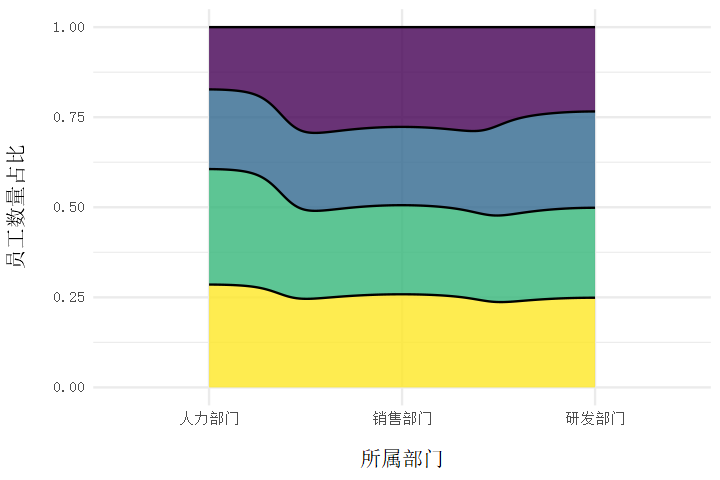

In [79]:
options(repr.plot.width=6, repr.plot.height=4) 

p_b_r <- df_zh %>% 
ggplot(aes(x=所属部门, group=人际关系满意度, fill=人际关系满意度)) +
geom_density(adjust=1.5, position="fill", size=0.5) + 
# 颜色集
scale_fill_viridis(alpha=0.8) +
theme_minimal() + 
# 设置图例顺序
guides(fill = guide_legend(reverse=FALSE)) +
labs(y=st_y_per) +
theme(text = element_text(family = font, size=11),
      axis.title.x = element_text(margin = margin(t = 15, r = 0, b = 0, l = 0), size=12), 
      axis.title.y = element_text(margin = margin(t = 0, r = 15, b = 0, l = 0), size=12)) +
# 不显示图例
theme(legend.position="none") 
p_b_r

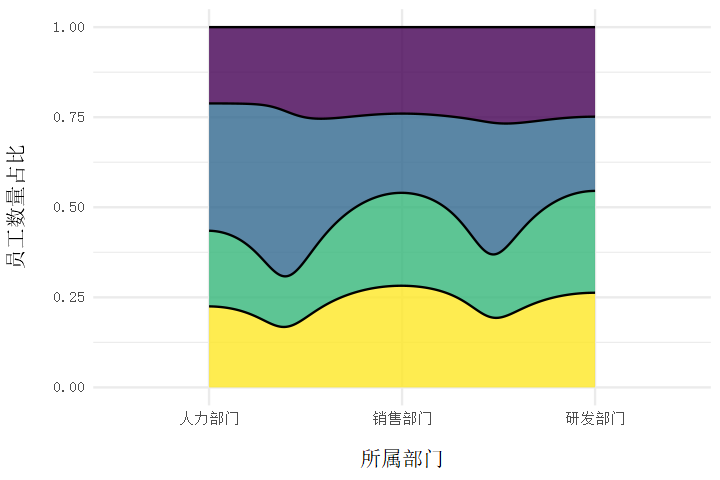

In [80]:
options(repr.plot.width=6, repr.plot.height=4) 

p_b_g <- df_zh %>% 
ggplot(aes(x=所属部门, group=工作满意度, fill=工作满意度)) +
geom_density(adjust=1.5, position="fill", size=0.5) + 
# 颜色集
scale_fill_viridis(alpha=0.8) +
theme_minimal() + 
# 设置图例顺序
guides(fill = guide_legend(reverse=FALSE)) +
labs(y=st_y_per) +
theme(text = element_text(family = font, size=11),
      axis.title.x = element_text(margin = margin(t = 15, r = 0, b = 0, l = 0), size=12), 
      axis.title.y = element_text(margin = margin(t = 0, r = 15, b = 0, l = 0), size=12)) +
# 不显示图例
theme(legend.position="none") 
p_b_g

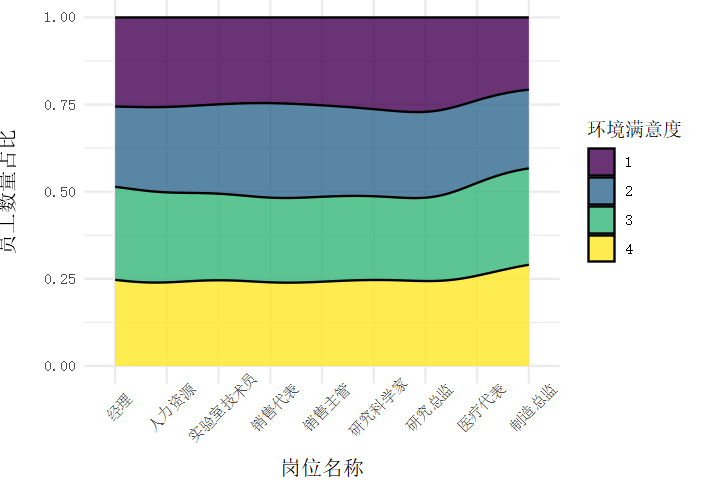

In [81]:
options(repr.plot.width=6, repr.plot.height=4) 

p_g_h <- df_zh %>% 
ggplot(aes(x=岗位名称, group=环境满意度, fill=环境满意度)) +
geom_density(adjust=1.5, position="fill", size=0.5) + 
# 颜色集
scale_fill_viridis(alpha=0.8) +
theme_minimal() + 
# 设置图例顺序
guides(fill = guide_legend(reverse=FALSE)) +
labs(y=st_y_per) +
theme(text = element_text(family = font, size=11),
      axis.title.x = element_text(margin = margin(t = -10, r = 0, b = 0, l = 0), size=12), 
      axis.title.y = element_text(margin = margin(t = 0, r = 15, b = 0, l = 0), size=12),
      axis.text.x = element_text(margin = margin(t = 10, r = 0, b = 0, l = 0), angle=45)) +
theme(plot.margin = margin(t = 0, r = .5, b = 0, l = 0, unit = "cm"))
p_g_h

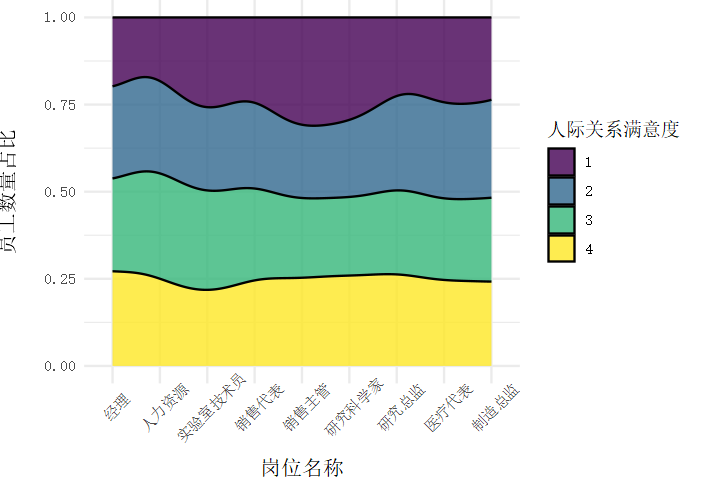

In [82]:
options(repr.plot.width=6, repr.plot.height=4) 

p_g_r <- df_zh %>% 
ggplot(aes(x=岗位名称, group=人际关系满意度, fill=人际关系满意度)) +
geom_density(adjust=1.5, position="fill", size=0.5) + 
# 颜色集
scale_fill_viridis(alpha=0.8) +
theme_minimal() + 
# 设置图例顺序
guides(fill = guide_legend(reverse=FALSE)) +
labs(y=st_y_per) +
theme(text = element_text(family = font, size=11),
      axis.title.x = element_text(margin = margin(t = -10, r = 0, b = 0, l = 0), size=12), 
      axis.title.y = element_text(margin = margin(t = 0, r = 15, b = 0, l = 0), size=12),
      axis.text.x = element_text(margin = margin(t = 10, r = 0, b = 0, l = 0), angle=45)) +
theme(plot.margin = margin(t = 0, r = .5, b = 0, l = 0, unit = "cm"))
p_g_r

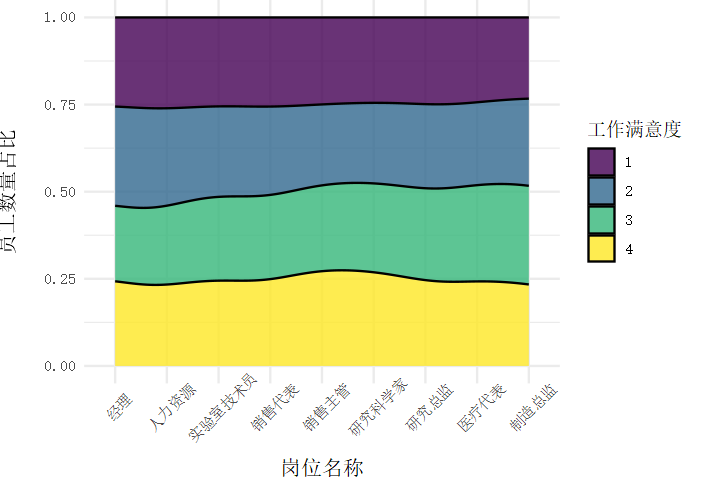

In [83]:
options(repr.plot.width=6, repr.plot.height=4) 

p_g_g <- df_zh %>% 
ggplot(aes(x=岗位名称, group=工作满意度, fill=工作满意度)) +
geom_density(adjust=1.5, position="fill", size=0.5) + 
# 颜色集
scale_fill_viridis(alpha=0.8) +
theme_minimal() + 
# 设置图例顺序
guides(fill = guide_legend(reverse=FALSE)) +
labs(y=st_y_per) +
theme(text = element_text(family = font, size=11),
      axis.title.x = element_text(margin = margin(t = -10, r = 0, b = 0, l = 0), size=12), 
      axis.title.y = element_text(margin = margin(t = 0, r = 15, b = 0, l = 0), size=12),
      axis.text.x = element_text(margin = margin(t = 10, r = 0, b = 0, l = 0), angle=45)) +
theme(plot.margin = margin(t = 0, r = .5, b = 0, l = 0, unit = "cm"))
      
p_g_g

Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
"conversion failure on '环境满意度' in 'mbcsToSbcs': dot substituted for <e7>"
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
"conversion failure on '环境满意度' in 'mbcsToSbcs': dot substituted for <8e>"
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
"conversion failure on '环境满意度' in 'mbcsToSbcs': dot substituted for <af>"
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
"conversion failure on '环境满意度' in 'mbcsToSbcs': dot substituted for <e5>"
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
"conversion failure on '环境满意度' in 'mbcsToSbcs': dot substituted for <a2>"
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$label), x$x, x$y, :
"conversion failure on '环境满意度' in 'mbcsToSbcs': dot substituted for <83>"
Warning message in grid.Call(C_textBounds, as.graphicsAnnot(x$la

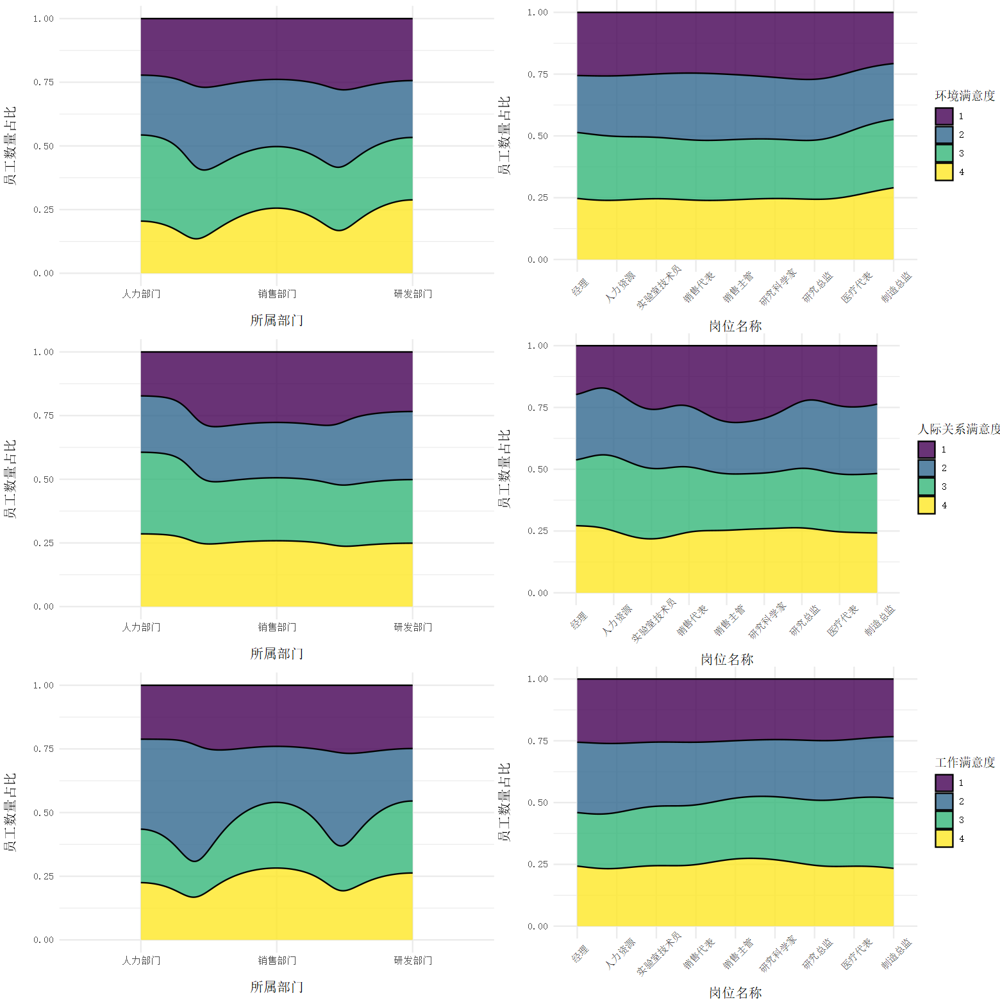

In [84]:
options(repr.plot.width=13, repr.plot.height=13) 

plot_grid(p_b_h, p_g_h, p_b_r, p_g_r, p_b_g, p_g_g, ncol=2, nrow=3)

# Conclusion

The factors with the most significant impact on turnover are overtime, income and age, with satisfaction and total years of service being the next most influential factors. Surprisingly, age has a very significant effect on turnover, yet gender has almost no effect on turnover for the same underlying demographic factors. For the other demographic characteristics, marital status has an insignificant level of influence, and relatively low levels of education are more likely to cause attrition. Department and position have some effect, but not to a significant degree. Despite the significant effect of income, performance ratings have little effect on attrition. In terms of work status, only environmental satisfaction had a more significant effect on turnover for the three satisfaction scores, and work-life balance had a non-significant effect.


The above findings suggest the following management insights for managers to help reduce employee attrition:
1. Overtime Situation Management: Reduce excessive overtime work and provide appropriate working hours and workload management to avoid employee fatigue and dissatisfaction due to excessive overtime work.
2. Income Management: Ensure that employees are paid at a reasonable level and provide competitive remuneration packages to attract and retain good employees.
3. Age management: Emphasize the age characteristics of employees and provide development opportunities and benefits that suit the needs of employees of different age groups to enhance their sense of belonging and job satisfaction.
4. Satisfaction management: Pay attention to the job satisfaction of employees, and enhance their satisfaction and work motivation by providing good working environment, training and development opportunities.
5. total working years management: pay attention to employees' work experience and development, provide them with promotion opportunities, career development planning, etc. in order to increase their job stability and loyalty.
6. Management of other demographic characteristics: Although gender and marital status have less impact on employee turnover, it is still necessary to pay attention to individual needs and equal treatment of employees to avoid unfairness caused by demographic factors.
7. Department and position management: Pay attention to the characteristics of departments and positions, and provide employees with appropriate resource support and development opportunities to enhance their sense of belonging and job satisfaction.
8. Performance Rating Management: Emphasize the fairness and accuracy of performance ratings to ensure that performance ratings are in line with the actual performance of employees and to avoid the negative impact of performance ratings on employee turnover.
9. Work-life balance management: Pay attention to the work-life balance of employees and provide flexible work arrangements and support measures to reduce employee turnover due to excessive work pressure.